In [1]:
import keras
from keras.models import load_model, model_from_json

Using TensorFlow backend.


In [2]:
import tensorflow as tf

def multinomial_nll(true_counts, logits):
    """Compute the multinomial negative log-likelihood
    Args:
      true_counts: observed count values
      logits: predicted logit values
    """
    counts_per_example = tf.reduce_sum(true_counts, axis=-1)
    dist = tf.contrib.distributions.Multinomial(total_count=counts_per_example,
                                                logits=logits)
    return -tf.reduce_sum(dist.log_prob(true_counts)) / tf.to_float(tf.shape(true_counts)[0])


class MultichannelMultinomialNLL(object):
    def __init__(self, n):
        self.__name__ = "MultichannelMultinomialNLL"
        self.n = n

    def __call__(self, true_counts, logits):
        for i in range(self.n):
            loss = multinomial_nll(true_counts[..., i], logits[..., i])
            if i == 0:
                total = loss
            else:
                total += loss
        return total

    def get_config(self):
        return {"n": self.n}

from keras.utils import CustomObjectScope
from keras.models import load_model
with CustomObjectScope({'MultichannelMultinomialNLL': MultichannelMultinomialNLL}):
    keras_model = load_model("model.h5")

W0716 12:13:41.403777 139651838932800 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0716 12:13:41.436225 139651838932800 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0716 12:13:42.148169 139651838932800 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0716 12:13:42.149373 139651838932800 deprecation_wrapper.py:119] From /users/avanti/anaconda3/lib/python3.7/site-packages/keras/backend/tensorflow_backend.py:184: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto i

In [3]:
keras_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
seq (InputLayer)                (None, 1000, 4)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1000, 64)     6464        seq[0][0]                        
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 1000, 64)     12352       conv1d_1[0][0]                   
__________________________________________________________________________________________________
add_1 (Add)                     (None, 1000, 64)     0           conv1d_1[0][0]                   
                                                                 conv1d_2[0][0]                   
__________

In [4]:
def get_out_tensor(inp_tensor, layer_to_copy, param_overrides={}):
    new_config = dict(layer_to_copy.get_config().items())
    for param_name in param_overrides:
        assert param_name in new_config
        new_config[param_name] = param_overrides[param_name]
    new_layer = layer_to_copy.__class__.from_config(new_config)
    adjusted_input_shape = list(layer_to_copy.input_shape)
    assert len(adjusted_input_shape)==3
    adjusted_input_shape[1] = None #flexible input len for convs
    adjusted_input_shape = tuple(adjusted_input_shape)
    new_layer.build(adjusted_input_shape)
    new_layer.set_weights(layer_to_copy.get_weights())
    out_tensor = new_layer(inp_tensor)
    return out_tensor

In [5]:
inp_tensor = keras.layers.Input((None,4))

conv1_out = get_out_tensor(inp_tensor=inp_tensor,
                           layer_to_copy=keras_model.layers[1],
                           param_overrides={'padding': 'same'})
conv2_out = get_out_tensor(inp_tensor=conv1_out,
                           layer_to_copy=keras_model.layers[2],
                           param_overrides={'padding': 'same'})
add_out = keras.layers.Add()([conv1_out, conv2_out])

convs = [conv1_out, conv2_out]

for i in range(8):
    conv_out = get_out_tensor(inp_tensor=add_out,
                              layer_to_copy=keras_model.layers[4 + 2*i],
                              param_overrides={'padding': 'same'})
    convs.append(conv_out)
    add_out = keras.layers.Add()([add_out, conv_out])

gaps = [keras.layers.GlobalAveragePooling1D()(x) for x in convs]

#conv3_out =  get_out_tensor(inp_tensor=add1_out,
#                            layer_to_copy=keras_model.layers[4],
#                            param_overrides={'padding': 'same'})
#add2_out = keras.layers.Add()([add1_out, conv3_out])
#conv4_out =  get_out_tensor(inp_tensor=add2_out,
#                            layer_to_copy=keras_model.layers[6],
#                            param_overrides={'padding': 'same'})
#add3_out = keras.layers.Add()([add2_out, conv4_out])
#conv5_out =  get_out_tensor(inp_tensor=add3_out,
#                            layer_to_copy=keras_model.layers[8],
#                            param_overrides={'padding': 'same'})

#conv1_gap = keras.layers.GlobalAveragePooling1D()(conv1_out)
#conv2_gap = keras.layers.GlobalAveragePooling1D()(conv2_out)
#conv3_gap = keras.layers.GlobalAveragePooling1D()(conv3_out)
#conv4_gap = keras.layers.GlobalAveragePooling1D()(conv4_out)

concat = keras.layers.Concatenate(axis=-1)(gaps)
embedding_model = keras.models.Model(inputs=inp_tensor, outputs=concat)

In [6]:
embedding_model.save("embedding_model.h5")

In [7]:
import numpy as np
embedding_model.predict(np.random.random((10, 41, 4))).shape

(10, 640)

In [8]:
embedding_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, 4)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, None, 64)     6464        input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, None, 64)     12352       conv1d_1[0][0]                   
__________________________________________________________________________________________________
add_1 (Add)                     (None, None, 64)     0           conv1d_1[0][0]                   
                                                                 conv1d_2[0][0]                   
__________

In [22]:
inp_tensor = keras.layers.Input((None,4))

conv1_out = get_out_tensor(inp_tensor=inp_tensor,
                           layer_to_copy=keras_model.layers[1],
                           param_overrides={'padding': 'same'})
conv2_out = get_out_tensor(inp_tensor=conv1_out,
                           layer_to_copy=keras_model.layers[2],
                           param_overrides={'padding': 'same'})
add_out = keras.layers.Add()([conv1_out, conv2_out])

convs = [conv1_out, conv2_out]

for i in range(8):
    conv_out = get_out_tensor(inp_tensor=add_out,
                              layer_to_copy=keras_model.layers[4 + 2*i],
                              param_overrides={'padding': 'same'})
    convs.append(conv_out)
    add_out = keras.layers.Add()([add_out, conv_out])

#conv3_out =  get_out_tensor(inp_tensor=add1_out,
#                            layer_to_copy=keras_model.layers[4],
#                            param_overrides={'padding': 'same'})
#add2_out = keras.layers.Add()([add1_out, conv3_out])
#conv4_out =  get_out_tensor(inp_tensor=add2_out,
#                            layer_to_copy=keras_model.layers[6],
#                            param_overrides={'padding': 'same'})
#add3_out = keras.layers.Add()([add2_out, conv4_out])
#conv5_out =  get_out_tensor(inp_tensor=add3_out,
#                            layer_to_copy=keras_model.layers[8],
#                            param_overrides={'padding': 'same'})

#conv1_gap = keras.layers.GlobalAveragePooling1D()(conv1_out)
#conv2_gap = keras.layers.GlobalAveragePooling1D()(conv2_out)
#conv3_gap = keras.layers.GlobalAveragePooling1D()(conv3_out)
#conv4_gap = keras.layers.GlobalAveragePooling1D()(conv4_out)

concat = keras.layers.Concatenate(axis=-1)(convs)
fullconv_model = keras.models.Model(inputs=inp_tensor, outputs=concat)

fullconv_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, None, 4)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, None, 64)     6464        input_2[0][0]                    
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, None, 64)     12352       conv1d_1[0][0]                   
__________________________________________________________________________________________________
add_10 (Add)                    (None, None, 64)     0           conv1d_1[0][0]                   
                                                                 conv1d_2[0][0]                   
__________

In [23]:
import numpy as np
fullconv_model.predict(np.random.random((10, 41, 4))).shape

(10, 41, 640)

In [9]:
import numpy as np
import h5py

f = h5py.File("/oak/stanford/groups/akundaje/avsec/basepair/data/"
              +"processed/comparison/output/nexus,peaks,OSNK,0,10"
              +",1,FALSE,same,0.5,64,25,0.004,9,FALSE,[1,50],TRUE"
              +",FALSE,1/deeplift.imp_score.h5", "r")
#f = h5py.File("/users/avanti/deeplift.imp_score.h5","r")
nanog_mask = np.array(f['metadata']['interval_from_task'][:]=='Nanog')
nanog_profile_wn_hypimp = np.array(f["hyp_imp/Nanog/profile/wn"][:])[nanog_mask]
onehot_seq = np.array(f["inputs/seq"][:])[nanog_mask]
nanog_profile_wn_contribs = nanog_profile_wn_hypimp*onehot_seq

In [10]:
nanog_profile_wn_contribs.shape

(55233, 1000, 4)

In [11]:
#print modisco commit hash
%cd /users/avanti/tfmodisco
!git log -n 1
%cd /users/avanti/tfmodisco_bio_experiments/bpnet/trial1

from importlib import reload

/mnt/lab_data2/avanti/tfmodisco
commit deb9880ff8845bfcc3657a266e1a857059b31fd7 (HEAD -> dev2, origin/dev2)
Author: AvantiShri <avanti.shrikumar@gmail.com>
Date:   Fri Jun 19 11:26:57 2020 -0700

    support for sparse return
/mnt/lab_data2/avanti/tfmodisco_bio_experiments/bpnet/trial1


In [12]:
%matplotlib inline
import h5py
import numpy as np
import modisco
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.phenograph
reload(modisco.cluster.phenograph)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.cluster
reload(modisco.cluster)
import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.affinitymat.transformers
reload(modisco.affinitymat.transformers)
import modisco.tfmodisco_workflow.seqlets_to_patterns
reload(modisco.tfmodisco_workflow.seqlets_to_patterns)
import modisco.tfmodisco_workflow.workflow
reload(modisco.tfmodisco_workflow.workflow)
import modisco.nearest_neighbors
reload(modisco.nearest_neighbors)
import modisco.affinitymat
reload(modisco.affinitymat)
import modisco.aggregator
reload(modisco.aggregator)
import modisco.value_provider
reload(modisco.value_provider)
import modisco.core
reload(modisco.core)
import modisco.coordproducers
reload(modisco.coordproducers)
import modisco.metaclusterers
reload(modisco.metaclusterers)
import modisco.clusterinit.memeinit
reload(modisco.clusterinit.memeinit)

%matplotlib inline

TF-MoDISco is using the TensorFlow backend.


num seqs to use: 1104
On task Nanog_profile_wn
Computing windowed sums on original
Generating null dist
peak(mu)= 0.003840833756548818
Computing threshold
Thresholds from null dist were -0.0166471004486084  and  0.10157325863838196
Final raw thresholds are -0.0166471004486084  and  0.10157325863838196
Final transformed thresholds are -0.519914596273292  and  0.8223334442472642


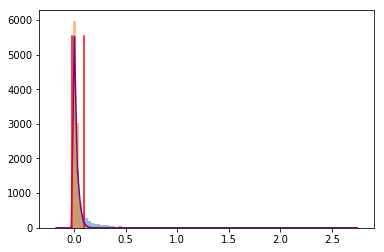

Got 9356 coords
After resolving overlaps, got 9356 seqlets
Across all tasks, the weakest transformed threshold used was: 0.519814596273292
MEMORY 3.32365824
9356 identified in total
Reducing weak_threshold_for_counting_sign to match weakest_transformed_thresh, from 0.8 to 0.519814596273292
2 activity patterns with support >= 100 out of 2 possible patterns
Metacluster sizes:  [8719, 637]
Idx to activities:  {0: '1', 1: '-1'}
MEMORY 3.324145664


In [13]:
import modisco
from collections import OrderedDict
import sys


def print_memory_use():
    import os
    import psutil
    process = psutil.Process(os.getpid())
    print("MEMORY",process.memory_info().rss/1000000000)

FRAC_SEQS_TO_USE = 0.02
NUM_SEQS_TO_USE = int(FRAC_SEQS_TO_USE*len(nanog_profile_wn_contribs))
print("num seqs to use:", NUM_SEQS_TO_USE)

task_names=["Nanog_profile_wn"]
contrib_scores={'Nanog_profile_wn':
                 nanog_profile_wn_contribs[:NUM_SEQS_TO_USE]}
hypothetical_contribs={'Nanog_profile_wn':
                       nanog_profile_wn_hypimp[:NUM_SEQS_TO_USE]}
one_hot=onehot_seq[:NUM_SEQS_TO_USE]
#null_tracks should either be a dictionary
# from task_name to 1d trakcs, or a callable
null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(
    num_to_samp=10000)
revcomp = True
plot_save_dir = "figures"

sliding_window_size = 21
flank_size = 10
histogram_bins = 100
percentiles_in_bandwidth = 10
overlap_portion = 0.5
min_metacluster_size = 100
min_metacluster_size_frac = 0.01
weak_threshold_for_counting_sign = 0.8
target_seqlet_fdr = 0.2
min_passing_windows_frac = 0.03
max_passing_windows_frac = 0.2
separate_pos_neg_thresholds = False
verbose = True
min_seqlets_per_task = None
other_tracks = []
#reducing from 50000 to 10000 for debugging purposes
max_seqlets_per_metacluster = 10000 #50000

overlap_resolver = modisco.core.SeqletsOverlapResolver(
    overlap_detector=modisco.core.CoordOverlapDetector(overlap_portion),
    seqlet_comparator=modisco.core.SeqletComparator(
       value_provider=
        modisco.value_provider.CoorScoreValueProvider()))

coord_producer = modisco.coordproducers.FixedWindowAroundChunks(
    sliding=sliding_window_size,
    flank=flank_size,
    suppress=(int(0.5*sliding_window_size)
              + flank_size),
    target_fdr=target_seqlet_fdr,
    min_passing_windows_frac=min_passing_windows_frac,
    max_passing_windows_frac=max_passing_windows_frac,
    separate_pos_neg_thresholds=separate_pos_neg_thresholds,
    max_seqlets_total=None,
    verbose=verbose,
    plot_save_dir=plot_save_dir) 

track_set = (modisco.tfmodisco_workflow.workflow.prep_track_set(
    task_names=task_names,
    contrib_scores=contrib_scores,
    hypothetical_contribs=hypothetical_contribs,
    one_hot=one_hot,
    revcomp=revcomp,
    other_tracks=other_tracks))

per_position_contrib_scores = OrderedDict([
    (x, [np.sum(s,axis=1) for s in contrib_scores[x]])
    for x in task_names])

multitask_seqlet_creation_results = modisco.core.MultiTaskSeqletCreator(
    coord_producer=coord_producer,
    overlap_resolver=overlap_resolver)(
        task_name_to_score_track=per_position_contrib_scores,
        null_tracks=null_per_pos_scores,
        track_set=track_set)

#find the weakest transformed threshold used across all tasks
weakest_transformed_thresh = (min(
    [min(x.tnt_results.transformed_pos_threshold,
         abs(x.tnt_results.transformed_neg_threshold))
         for x in (multitask_seqlet_creation_results.
                   task_name_to_coord_producer_results.values())]) -
    0.0001) #subtract 1e-4 to avoid weird numerical issues
print("Across all tasks, the weakest transformed threshold used"
      +" was: "+str(weakest_transformed_thresh))
print_memory_use()

all_seqlets = multitask_seqlet_creation_results.final_seqlets
print(str(len(all_seqlets))+" identified in total")
if (len(all_seqlets) < 100):
    print("WARNING: you found relatively few seqlets."
          +" Consider dropping target_seqlet_fdr") 

if int(min_metacluster_size_frac * len(all_seqlets)) > min_metacluster_size:
    print("min_metacluster_size_frac * len(seqlets) = {0} is more than min_metacluster_size={1}.".\
          format(int(min_metacluster_size_frac * len(all_seqlets)), min_metacluster_size))
    print("Using it as a new min_metacluster_size")
    min_metacluster_size = int(min_metacluster_size_frac * len(all_seqlets))

weak_threshold_for_counting_sign=0.8
if (weak_threshold_for_counting_sign is None):
    weak_threshold_for_counting_sign = weakest_transformed_thresh
else:
    weak_threshold_for_counting_sign =\
        weak_threshold_for_counting_sign
    
if (weak_threshold_for_counting_sign > weakest_transformed_thresh):
    print("Reducing weak_threshold_for_counting_sign to"
          +" match weakest_transformed_thresh, from "
          +str(weak_threshold_for_counting_sign)
          +" to "+str(weakest_transformed_thresh))
    weak_threshold_for_counting_sign = weakest_transformed_thresh

task_name_to_value_provider = OrderedDict([
    (task_name,
     modisco.value_provider.TransformCentralWindowValueProvider(
        track_name=task_name+"_contrib_scores",
        central_window=sliding_window_size,
        val_transformer= 
         coord_producer_results.tnt_results.val_transformer))
     for (task_name,coord_producer_results)
         in (multitask_seqlet_creation_results.
             task_name_to_coord_producer_results.items())])

min_metacluster_size=100
metaclusterer = modisco.metaclusterers.SignBasedPatternClustering(
                        min_cluster_size=min_metacluster_size,
                        task_name_to_value_provider=
                            task_name_to_value_provider,
                        task_names=task_names,
                        threshold_for_counting_sign=
                            weakest_transformed_thresh,
                        weak_threshold_for_counting_sign=
                            weak_threshold_for_counting_sign)

metaclustering_results = metaclusterer.fit_transform(all_seqlets)
metacluster_indices = np.array(
    metaclustering_results.metacluster_indices)
metacluster_idx_to_activity_pattern =\
    metaclustering_results.metacluster_idx_to_activity_pattern

num_metaclusters = max(metacluster_indices)+1
metacluster_sizes = [np.sum(metacluster_idx==metacluster_indices)
                      for metacluster_idx in range(num_metaclusters)]
if (verbose):
    print("Metacluster sizes: ",metacluster_sizes)
    print("Idx to activities: ",metacluster_idx_to_activity_pattern)
    print_memory_use()
    sys.stdout.flush()

In [14]:
metacluster_idx = 0
metacluster_size = metacluster_sizes[metacluster_idx]
print("On metacluster "+str(metacluster_idx))                       
if (max_seqlets_per_metacluster is None                        
    or max_seqlets_per_metacluster >= metacluster_size):       
    print("Metacluster size", metacluster_size)                     
else:                                                               
    print("Metacluster size {0} limited to {1}".format(             
            metacluster_size, max_seqlets_per_metacluster))    
sys.stdout.flush()                                                  
metacluster_activities = [                                          
    int(x) for x in                                                 
    metacluster_idx_to_activity_pattern[metacluster_idx].split(",")]
assert len(all_seqlets)==len(metacluster_indices)                       
metacluster_seqlets = [                                             
    x[0] for x in zip(all_seqlets, metacluster_indices)                 
    if x[1]==metacluster_idx][:max_seqlets_per_metacluster]    
relevant_task_names, relevant_task_signs =\
    zip(*[(x[0], x[1]) for x in                                     
        zip(task_names, metacluster_activities) if x[1] != 0])      
print('Relevant tasks: ', relevant_task_names)                      
print('Relevant signs: ', relevant_task_signs)                      
sys.stdout.flush()                                                  
if (len(relevant_task_names) == 0):                                 
    assert False, "This should not happen"                          
    sys.stdout.flush()                                              

onehot_track_name="sequence"
contrib_scores_track_names = [key+"_contrib_scores" for key in relevant_task_names]
hypothetical_contribs_track_names= [key+"_hypothetical_contribs" for key in relevant_task_names]                
track_signs=relevant_task_signs                              
other_comparison_track_names=[]



assert len(track_signs)==len(hypothetical_contribs_track_names)         
assert len(track_signs)==len(contrib_scores_track_names)                
                                                                                
seqlets_sorter = (lambda arr:                                           
                          sorted(arr,                                           
                                 key=lambda x:                                  
                                  -np.sum([np.sum(np.abs(x[track_name].fwd))    
                                     for track_name                             
                                     in contrib_scores_track_names])))

min_overlap_while_sliding = 0.7
pattern_comparison_settings =\
            modisco.affinitymat.core.PatternComparisonSettings(                         
                track_names=hypothetical_contribs_track_names                   
                            +contrib_scores_track_names                         
                            +other_comparison_track_names,                      
                track_transformer=modisco.affinitymat.L1Normalizer(),                   
                min_overlap=min_overlap_while_sliding)

#coarse_grained 1d embedder   
embedder_factory=(modisco.seqlet_embedding
                          .onehot_model_output.KerasModelOutputEmbedder
                          .get_factory(model_h5="embedding_model.h5"))
seqlets_to_1d_embedder = embedder_factory(                         
        onehot_track_name=onehot_track_name,                            
        toscore_track_names_and_signs=list(                             
        zip(hypothetical_contribs_track_names,                          
            [np.sign(x) for x in track_signs])))

#affinity matrix from embeddings                                        
coarse_affmat_computer =\
    modisco.affinitymat.core.AffmatFromSeqletEmbeddings(                        
        seqlets_to_1d_embedder=seqlets_to_1d_embedder,                  
        affinity_mat_from_1d=\
            modisco.affinitymat.core.NumpyCosineSimilarity(                     
                verbose=True,                                   
                gpu_batch_size=None),                                   
        verbose=True)                                           

affmat_from_seqlets_with_nn_pairs =\
    modisco.affinitymat.core.AffmatFromSeqletsWithNNpairs(                      
        pattern_comparison_settings=pattern_comparison_settings,        
        sim_metric_on_nn_pairs=\
            modisco.affinitymat.core.ParallelCpuCrossMetricOnNNpairs(           
                n_cores=10,                                   
                cross_metric_single_region=                             
                    modisco.affinitymat.core.CrossContinJaccardSingleRegion()))

seqlets = seqlets_sorter(metacluster_seqlets)
print("Computing coarse affmat", flush=True)
coarse_affmat = coarse_affmat_computer(seqlets)
print("Computing seqlet neighbors from coarse", flush=True)
seqlet_neighbors = (modisco.tfmodisco_workflow.seqlets_to_patterns
    .get_seqlet_neighbors_with_initcluster(       
        nearest_neighbors_to_compute=500,                         
        coarse_affmat=coarse_affmat,                                
        initclusters=None))
print("Computing fine-grained", flush=True)
affmat_from_seqlets_with_nn_pairs_argmax =\
    modisco.affinitymat.core.AffmatFromSeqletsWithNNpairs(
        pattern_comparison_settings=pattern_comparison_settings,
        sim_metric_on_nn_pairs=\
            modisco.affinitymat.core.ParallelCpuCrossMetricOnNNpairs(
                n_cores=10,
                cross_metric_single_region=
                    modisco.affinitymat.core.CrossContinJaccardSingleRegionWithArgmax()))

On metacluster 0
Metacluster size 8719
Relevant tasks:  ('Nanog_profile_wn',)
Relevant signs:  (1,)
Computing coarse affmat
Beginning embedding computation


/users/avanti/anaconda3/lib/python3.7/site-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Finished embedding computation in 17.37 s
Starting affinity matrix computations
Normalization computed in 0.12 s
Cosine similarity mat computed in 1.34 s
Normalization computed in 0.07 s
Cosine similarity mat computed in 1.24 s
Finished affinity matrix computations in 3.55 s
Computing seqlet neighbors from coarse
Computing fine-grained


In [16]:
from modisco.visualization import viz_sequence


def max_window_sum(ic_vals, window_size=6):
    per_pos_tot_ic = np.sum(ic_vals, axis=-1)
    cumsum = np.cumsum([0]+list(per_pos_tot_ic))
    return np.max(cumsum[window_size:] - cumsum[:-window_size])


def get_aligned_coordinates_for_premotif(sparse_nn_affmat_withargmax_row,
                                         seqlet_neighbors_row,
                                         seqlets,
                                         num_in_premotif):
    #subset to the num_in_premotif most similar
    argsort_indices = np.argsort(-sparse_nn_affmat_withargmax_row[:,0])[:num_in_premotif]
    seqlet_indices = np.array([seqlet_neighbors_row[i] for i in argsort_indices])
    isfwd = sparse_nn_affmat_withargmax_row[:,2][argsort_indices]
    #flip sign of offset if on reverse strand
    offsets = (sparse_nn_affmat_withargmax_row[:,1][argsort_indices])*(2*isfwd - 1)
    coords_to_return = []
    for seqlet_idx,offset,isfwd in zip(seqlet_indices,offsets,isfwd):
        new_coor = modisco.core.SeqletCoordinates(
            example_idx=seqlets[seqlet_idx].coor.example_idx,
            start=int(seqlets[seqlet_idx].coor.start-offset),
            end=int(seqlets[seqlet_idx].coor.end-offset),
            #flip is_revcomp according to value of isfwd
            is_revcomp=(seqlets[seqlet_idx].coor.is_revcomp==(isfwd==1.0)))
        coords_to_return.append(new_coor)
    return coords_to_return


def get_premotif_avgonehot(datatrack, **kwargs):
    coords = get_aligned_coordinates_for_premotif(**kwargs)
    to_avg = []
    for coor in coords:
        if (coor.start >= 0 and
            coor.end <= len(datatrack.fwd_tracks[coor.example_idx])):
            to_avg.append(datatrack.get_snippet(coor=coor).fwd)
    return np.mean(to_avg, axis=0)


def get_premotif_avgseqlets(track_set, **kwargs):
    coords = get_aligned_coordinates_for_premotif(**kwargs)
    premotif = modisco.core.Pattern()
    for track_name, datatrack in track_set.track_name_to_data_track.items():
        fwd_to_avg = []
        rev_to_avg = []
        for coor in coords:
            if (coor.start >= 0 and
                coor.end <= len(datatrack.fwd_tracks[coor.example_idx])):
                fwd_to_avg.append(datatrack.get_snippet(coor=coor).fwd)
                rev_to_avg.append(datatrack.get_snippet(coor=coor).rev)
        fwd = np.mean(fwd_to_avg, axis=0)
        rev = np.mean(rev_to_avg, axis=0)
        snippet = modisco.core.Snippet(fwd=fwd, rev=rev, has_pos_axis=True)
        premotif.track_name_to_snippet[track_name] = snippet
    return premotif
    
bg_freq = np.mean(onehot_seq, axis=(0,1))

NUM_IN_PREMOTIF=10
round_sparse_nn_affmat_withargmax = []
round_premotif_avgseqlets = []
round_premotif_ics = []
current_seqlets = seqlets
for roundnumber in range(4): 
    print("ROUND NUMBER",roundnumber)
    sparse_nn_affmat_withargmax = affmat_from_seqlets_with_nn_pairs_argmax(
        seqlet_neighbors=seqlet_neighbors,
        seqlets=current_seqlets,
        return_sparse=True)
    round_sparse_nn_affmat_withargmax.append(sparse_nn_affmat_withargmax)

    premotif_avgseqlets = [
        get_premotif_avgseqlets(
            track_set=track_set,
            sparse_nn_affmat_withargmax_row=sparse_nn_affmat_withargmax[idx],
            seqlet_neighbors_row=seqlet_neighbors[idx],
            seqlets=seqlets,
            num_in_premotif=NUM_IN_PREMOTIF)
        for idx in range(len(seqlets))]
    round_premotif_avgseqlets.append(premotif_avgseqlets)
    
    premotif_ics = np.array([
        max_window_sum(viz_sequence.ic_scale(
            pwm=premotif_avgseqlet["sequence"].fwd,
            background=bg_freq))
        for premotif_avgseqlet in premotif_avgseqlets])
    round_premotif_ics.append(premotif_ics)
    
    current_seqlets = premotif_avgseqlets

ROUND NUMBER 0
Launching nearest neighbors affmat calculation job
MEMORY 4.651708416
Parallel runs completed
MEMORY 4.725055488
Job completed in: 55.37 s
MEMORY 4.72573952
Launching nearest neighbors affmat calculation job
MEMORY 4.725501952
Parallel runs completed
MEMORY 4.797915136
Job completed in: 60.67 s
MEMORY 4.798046208
ROUND NUMBER 1
Launching nearest neighbors affmat calculation job
MEMORY 4.94143488
Parallel runs completed
MEMORY 4.941869056
Job completed in: 64.46 s
MEMORY 4.942544896
Launching nearest neighbors affmat calculation job
MEMORY 4.942544896
Parallel runs completed
MEMORY 4.971384832
Job completed in: 64.05 s
MEMORY 4.972064768
ROUND NUMBER 2
Launching nearest neighbors affmat calculation job
MEMORY 5.138870272
Parallel runs completed
MEMORY 5.141172224
Job completed in: 64.1 s
MEMORY 5.141856256
Launching nearest neighbors affmat calculation job
MEMORY 5.141868544
Parallel runs completed
MEMORY 5.143310336
Job completed in: 72.19 s
MEMORY 5.143986176
ROUND NUMB

In [19]:
import scipy


def reconstitute_dense_affmat(sparse_affmat_withargmax, seqlet_neighbors):
    to_return = np.zeros((len(seqlet_neighbors), len(seqlet_neighbors)))
    for row_idx, (neighbors, affinitieswithargmax) in enumerate(zip(seqlet_neighbors, sparse_affmat_withargmax)):
        affinities = affinitieswithargmax[:,0]
        for col_idx, val in zip(neighbors, affinities):
            to_return[row_idx, col_idx] = val
    return to_return


def get_correlations(main_affmat, other_affmat):
    correlations = []
    for main_affmat_row, other_affmat_row\
        in zip(main_affmat, other_affmat):
        #compare correlation on the nonzero rows
        to_compare_mask = np.abs(main_affmat_row) > 0
        corr = scipy.stats.spearmanr(
                main_affmat_row[to_compare_mask],
                other_affmat_row[to_compare_mask])
        correlations.append(corr.correlation)
    correlations = np.array(correlations)
    return correlations

round_correlations = [get_correlations(main_affmat=reconstitute_dense_affmat(
                                    sparse_affmat_withargmax=sparse_nn_affmat_withargmax,
                                    seqlet_neighbors=seqlet_neighbors),
                                other_affmat=coarse_affmat)
                      for sparse_nn_affmat_withargmax in round_sparse_nn_affmat_withargmax]

Round idx 0
ICs:
0.010551668769354284


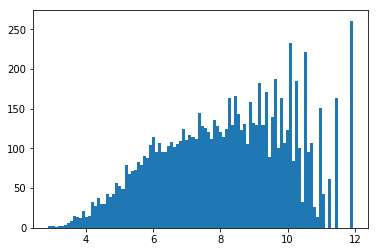

Embedding correlations:
0.12765225369881866


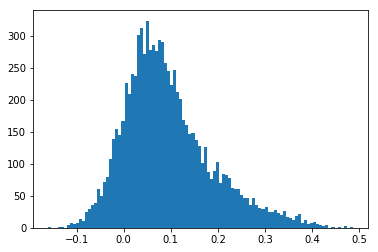

Round idx 1
ICs:
0.00894598004358298


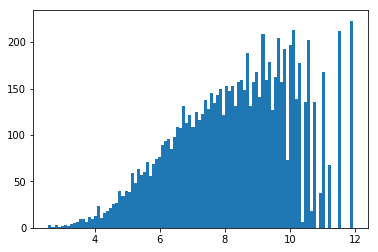

Embedding correlations:
0.1372863860534465


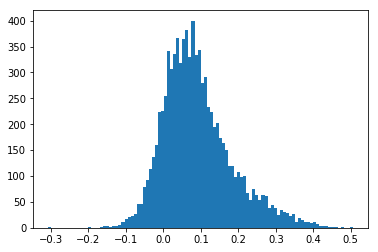

Round idx 2
ICs:
0.007454983369652483


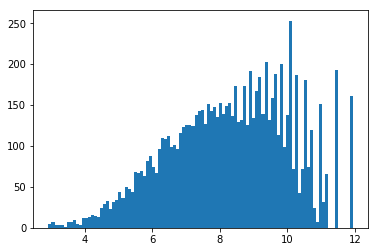

Embedding correlations:
0.15827503154031425


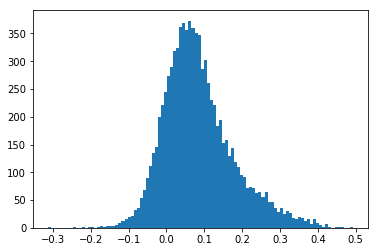

Round idx 3
ICs:
0.007225599265970868


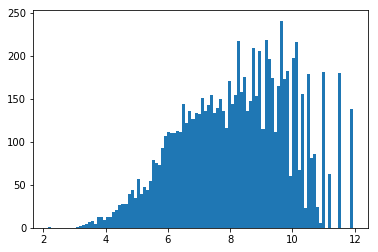

Embedding correlations:
0.16641816722101158


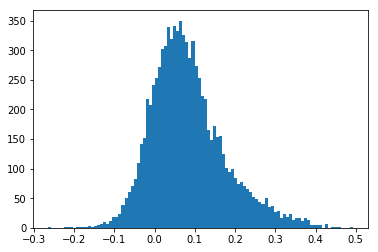

In [20]:
from matplotlib import pyplot as plt

thresh = 4

for idx,(premotif_ics,correlations) in enumerate(zip(round_premotif_ics, round_correlations)):
    print("Round idx", idx)
    print("ICs:")
    plt.hist(premotif_ics, bins=100)
    print(np.mean(premotif_ics < thresh))
    plt.show()
    print("Embedding correlations:")
    plt.hist(correlations, bins=100)
    print(np.mean(correlations < 0))
    plt.show()

#######################
FILTERING PERCENTILE: 0.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 2.1665969491004944)
Coordinate:  example:363,start:405,end:446,rc:False
Contrib scores:


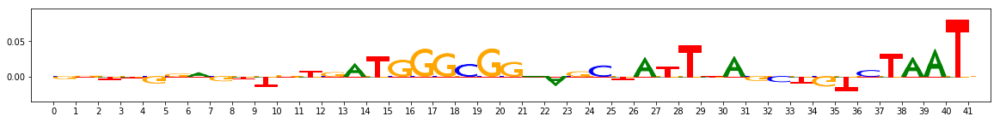

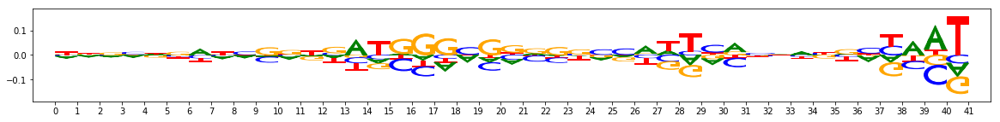

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.053079456090927


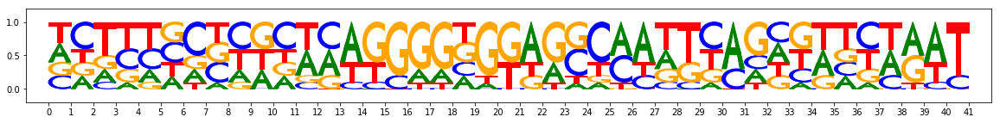

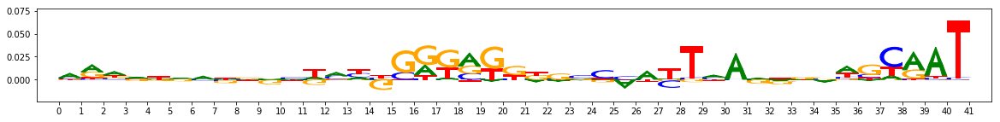

Round correlation 0.047338311424958854
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.538285881280899


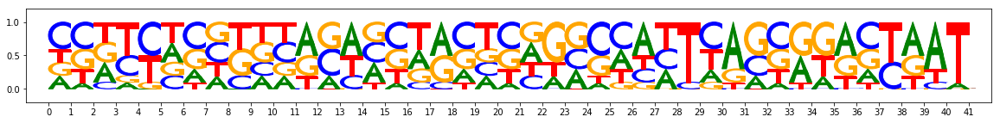

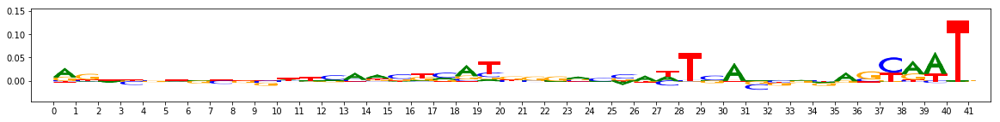

Round correlation 0.03205315265882578
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.851496011018753


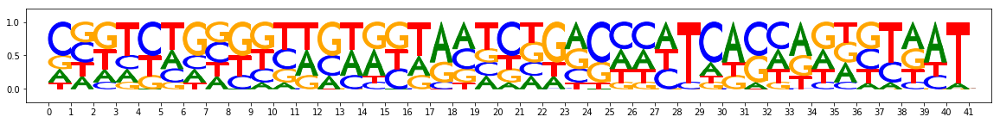

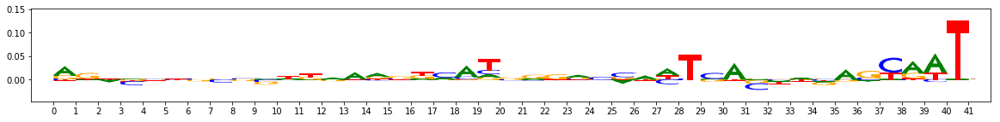

Round correlation 0.014754681871317126
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.1665969491004944


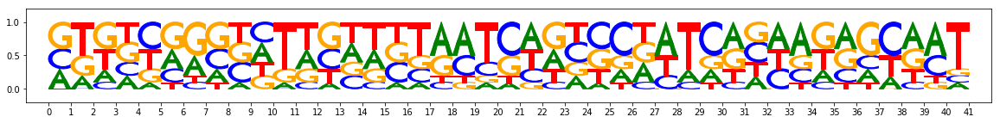

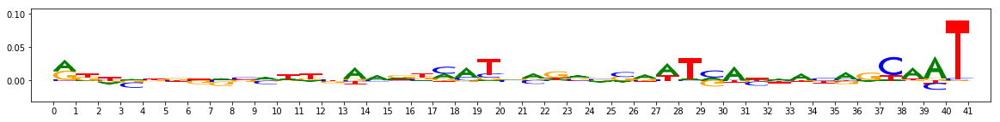

Round correlation 0.008492497077558033
#######################
FILTERING PERCENTILE: 5.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 5.216349214315414)
Coordinate:  example:608,start:428,end:469,rc:False
Contrib scores:


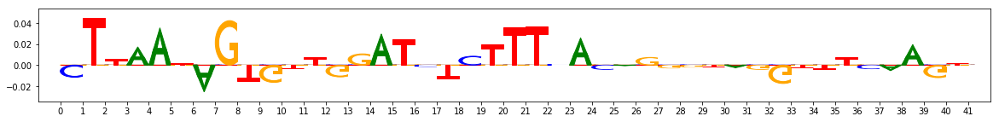

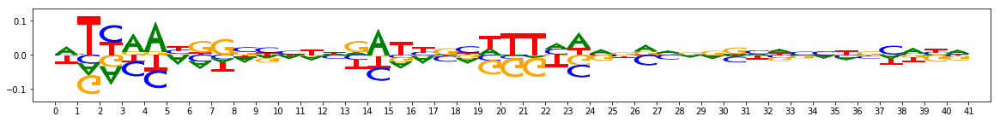

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.86697718501091


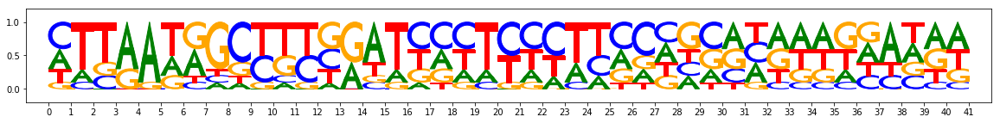

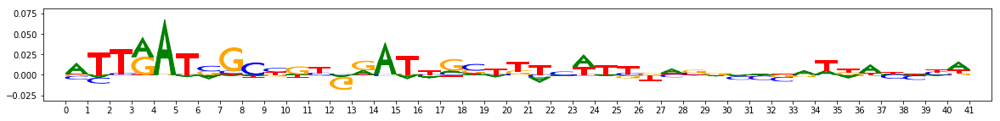

Round correlation -0.001701553150347267
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.21726006269455


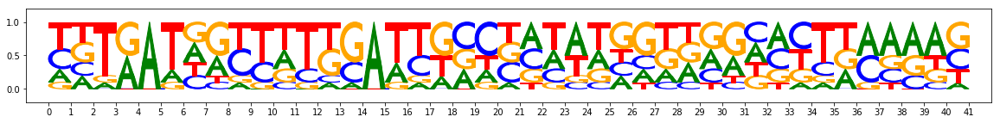

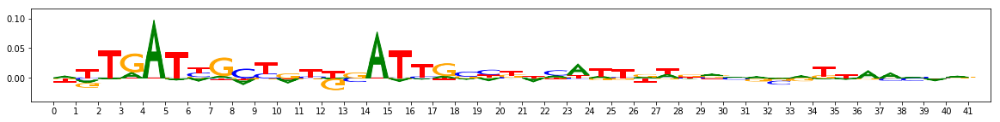

Round correlation 0.10283155296569677
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.0850727036595345


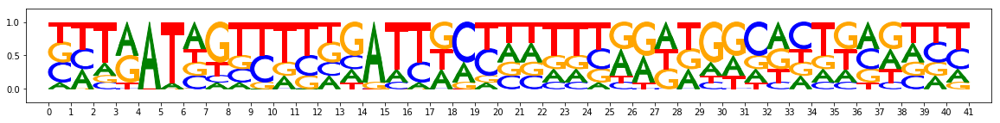

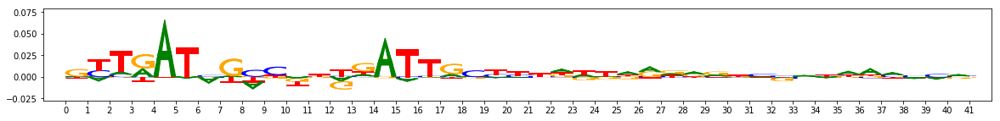

Round correlation 0.10679409818422601
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.216349214315414


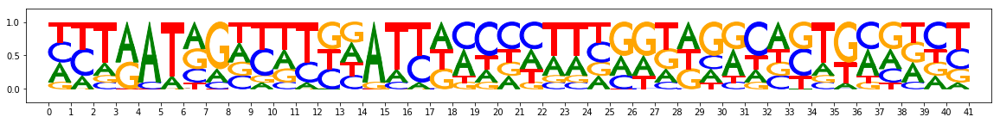

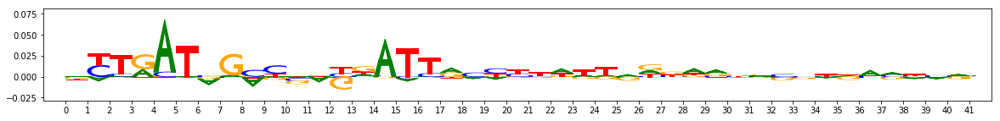

Round correlation 0.11001336498381888
#######################
FILTERING PERCENTILE: 10.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 5.853428423404694)
Coordinate:  example:530,start:404,end:445,rc:False
Contrib scores:


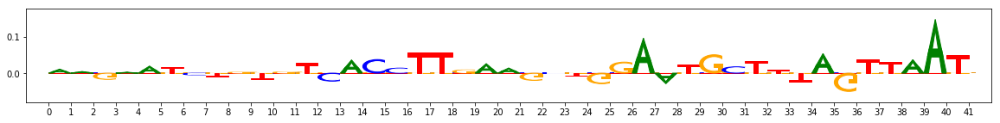

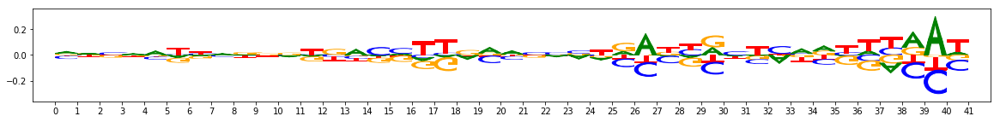

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.989176660776138


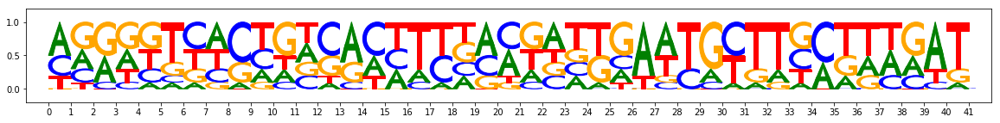

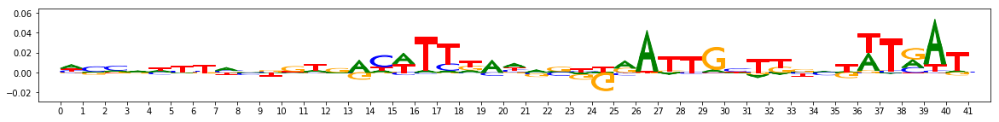

Round correlation -0.003540091554750074
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.473936975002289


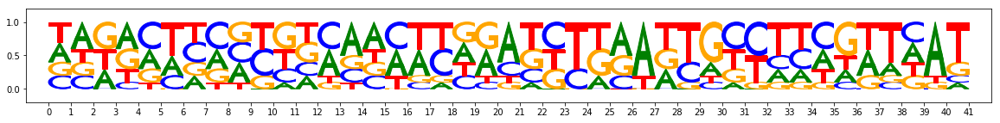

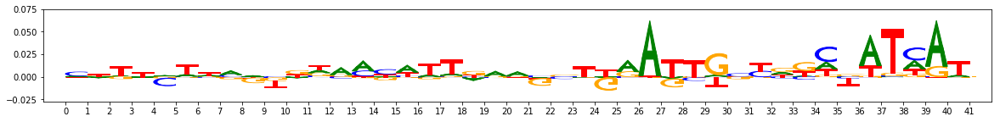

Round correlation -0.006291195253858297
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.075519502162933


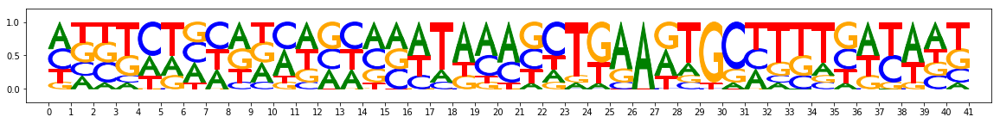

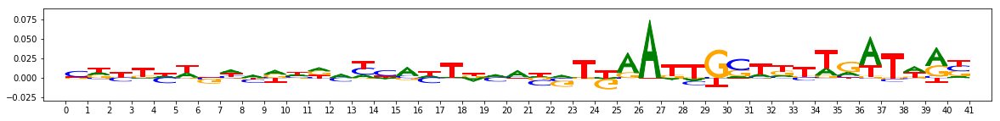

Round correlation 0.043758003167927786
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.853428423404694


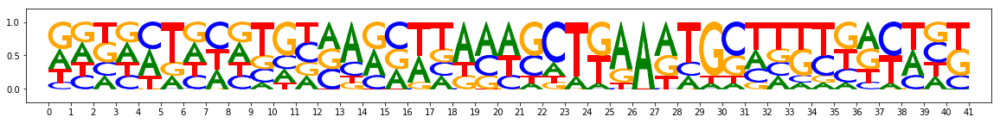

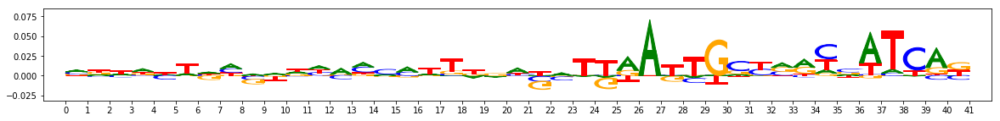

Round correlation 0.05413336523765638
#######################
FILTERING PERCENTILE: 15.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 6.24992823600769)
Coordinate:  example:682,start:578,end:619,rc:False
Contrib scores:


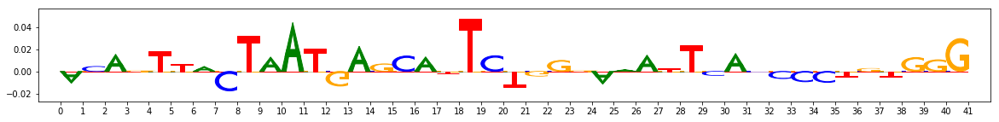

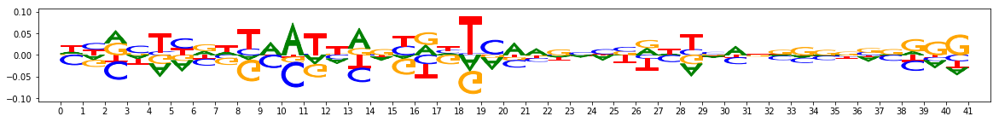

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.55658221244812


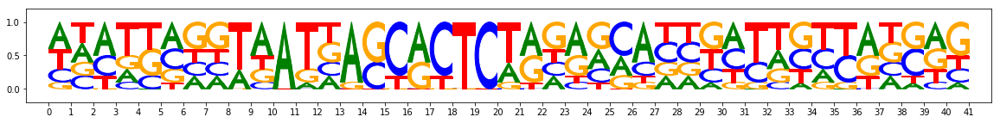

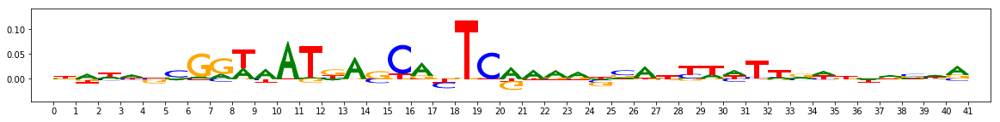

Round correlation -0.011565141462781823
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.410889089107513


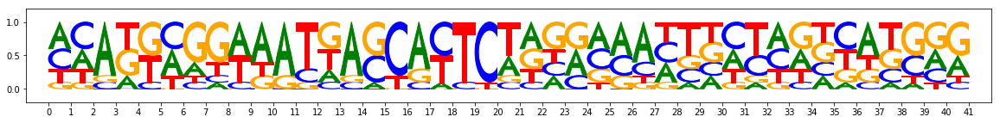

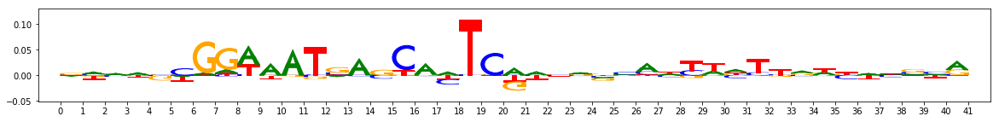

Round correlation 0.06479834421344656
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.410889089107513


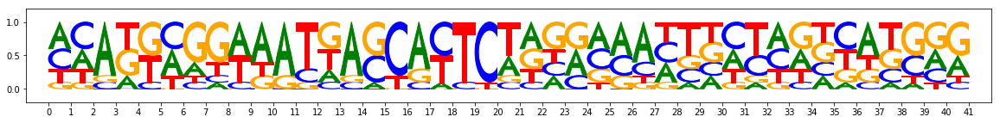

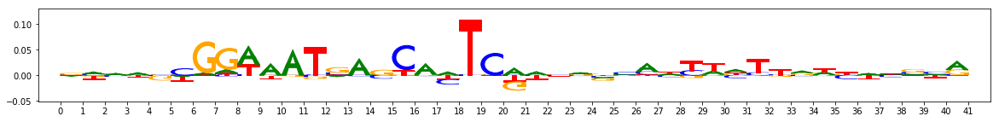

Round correlation 0.05752883490198513
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.24992823600769


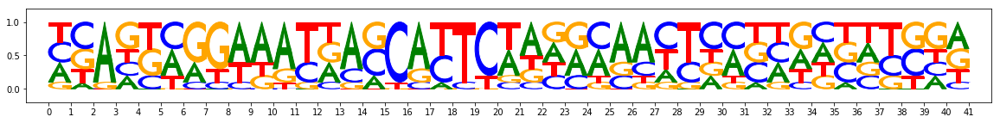

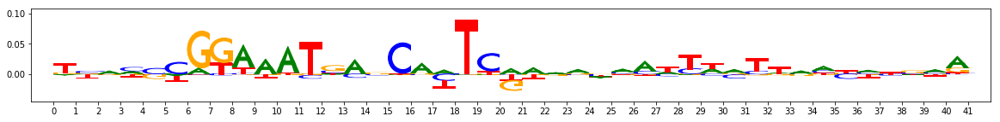

Round correlation 0.052329034925856104
#######################
FILTERING PERCENTILE: 20.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 6.5945790112018585)
Coordinate:  example:470,start:527,end:568,rc:False
Contrib scores:


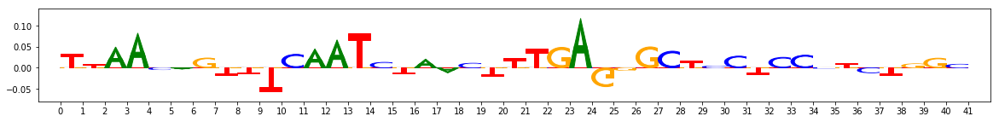

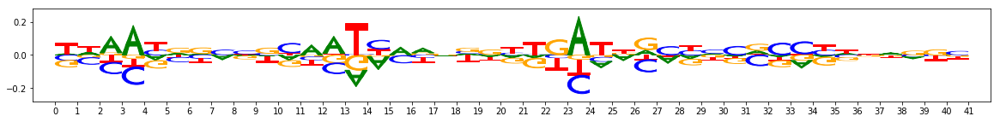

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.033610224723816


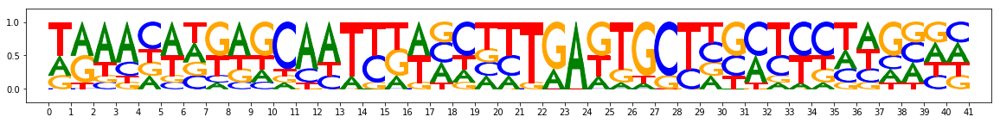

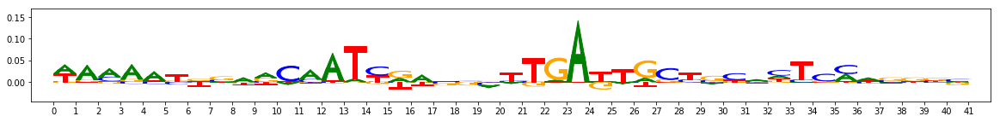

Round correlation 0.007280817199743177
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.216851353645325


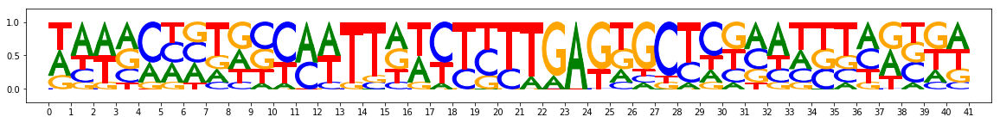

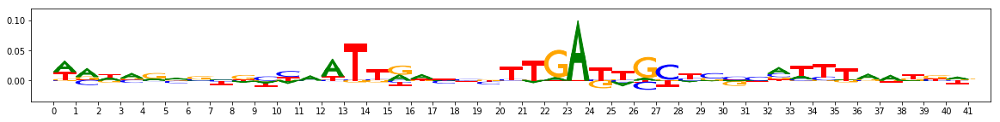

Round correlation -0.01151833439980603
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.05704465508461


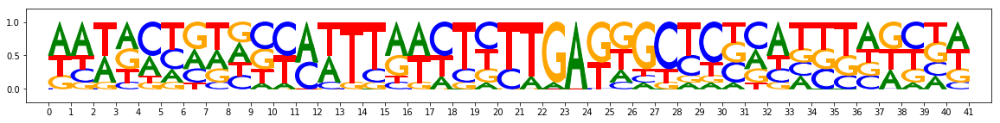

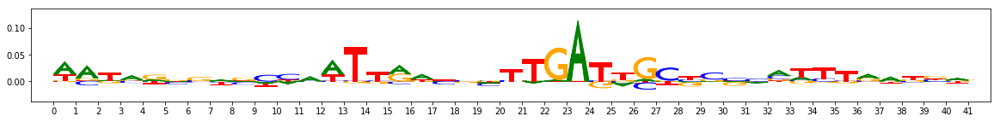

Round correlation 0.009177088711770077
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.5945790112018585


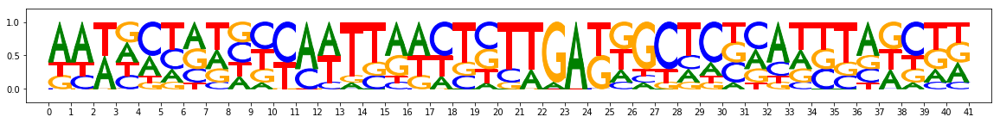

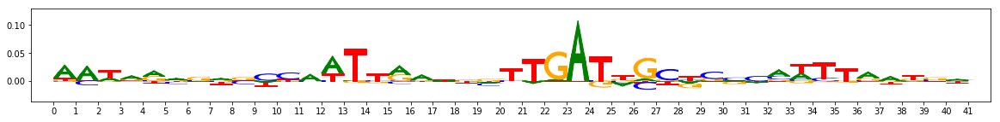

Round correlation 0.007267696204477628
#######################
FILTERING PERCENTILE: 25.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 6.927474290132523)
Coordinate:  example:1005,start:424,end:465,rc:False
Contrib scores:


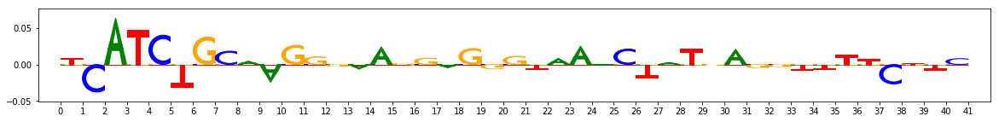

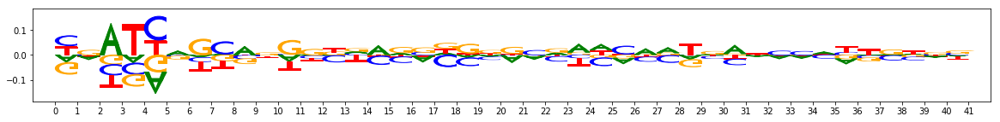

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.4813132882118225


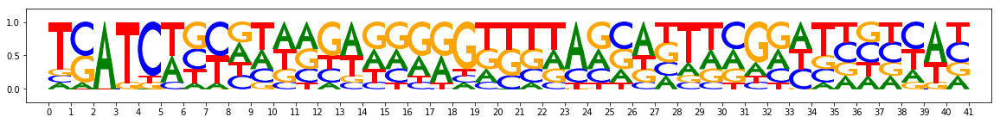

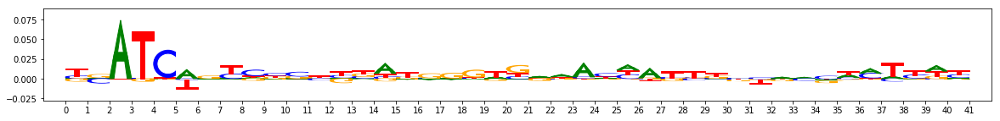

Round correlation 0.08413784985599061
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.724327087402344


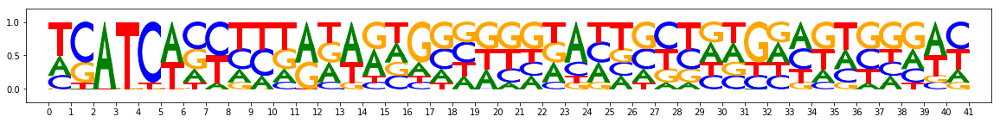

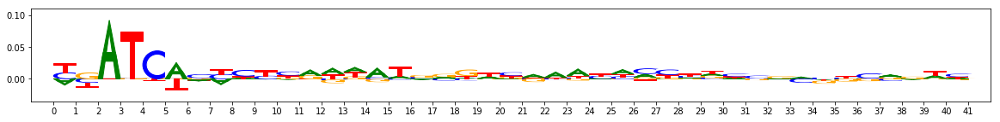

Round correlation 0.07240189635726767
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.31036776304245


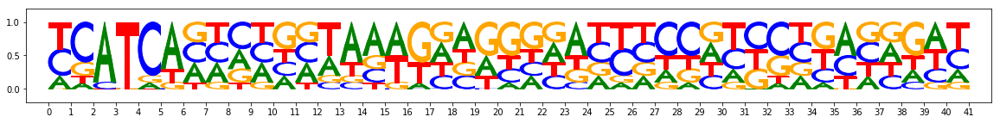

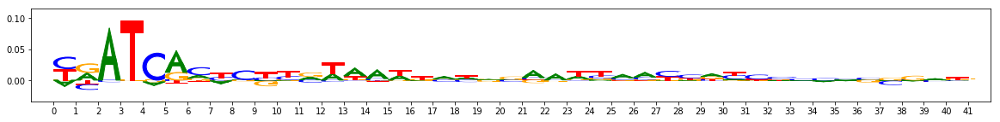

Round correlation 0.06364382600318026
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.927474290132523


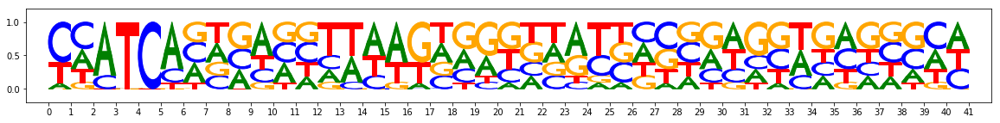

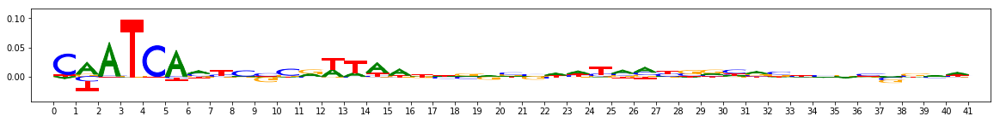

Round correlation 0.04789832744693828
#######################
FILTERING PERCENTILE: 30.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 7.22150132060051)
Coordinate:  example:860,start:459,end:500,rc:False
Contrib scores:


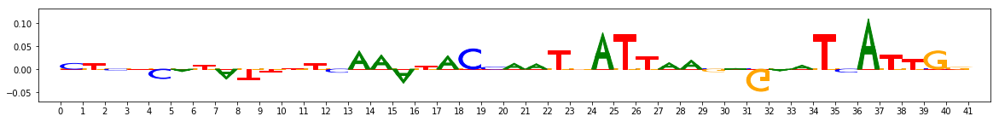

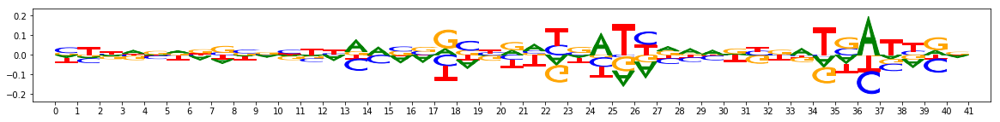

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.552283704280853


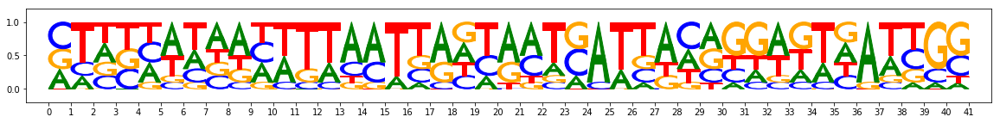

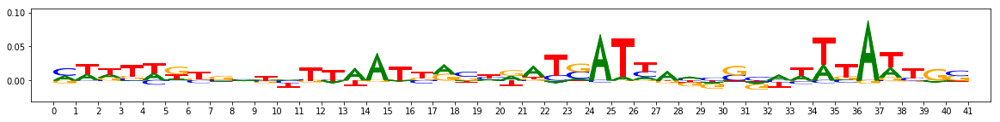

Round correlation 0.0010684925225682312
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.3802394568920135


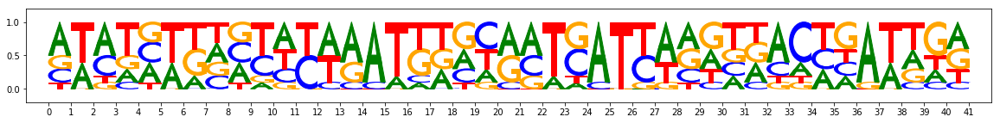

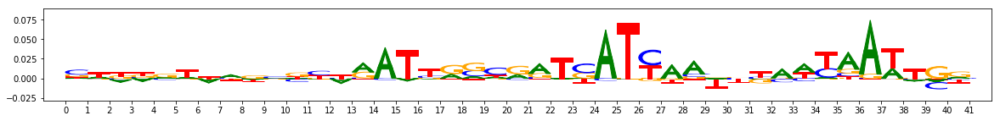

Round correlation 0.07588768461215463
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.001529365777969


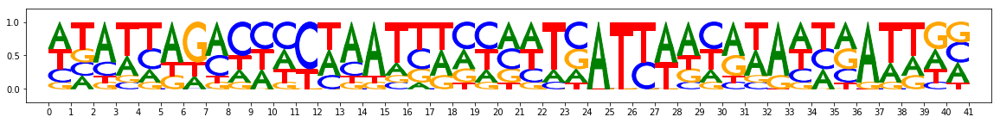

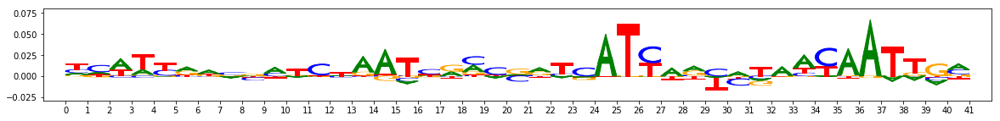

Round correlation 0.07261526522926894
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.22150132060051


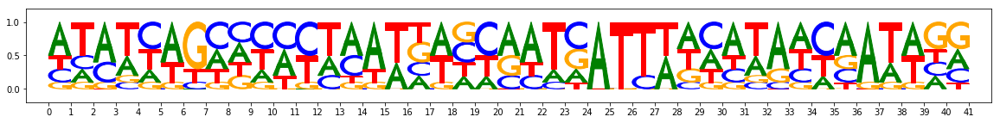

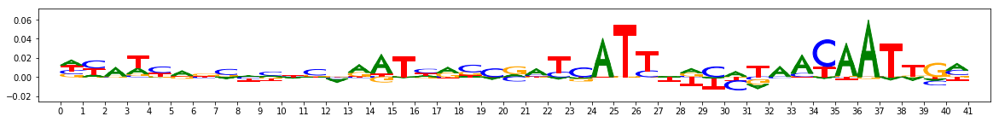

Round correlation 0.06283169269822969
#######################
FILTERING PERCENTILE: 35.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 7.512032628059387)
Coordinate:  example:552,start:501,end:542,rc:False
Contrib scores:


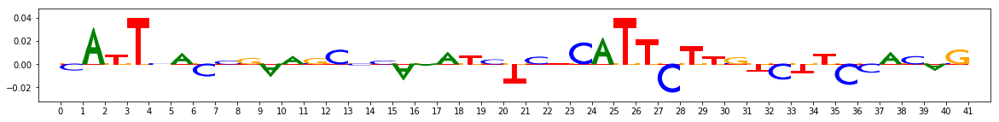

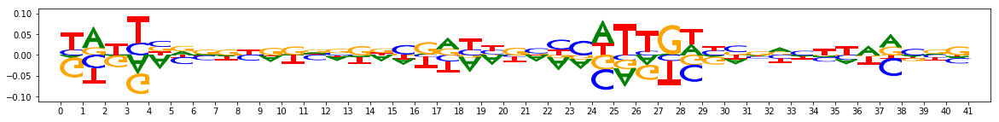

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.327072858810425


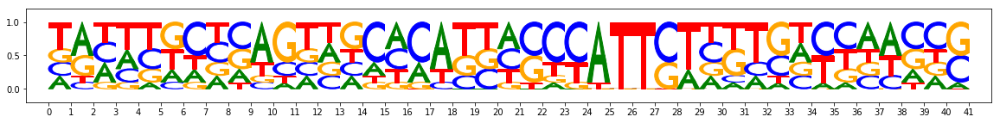

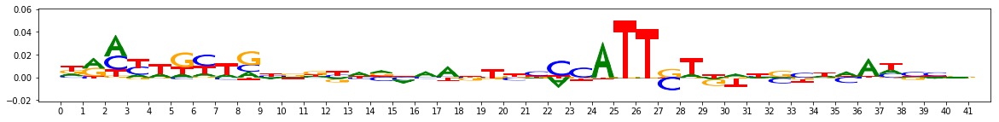

Round correlation -0.06006632154018657
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.685565829277039


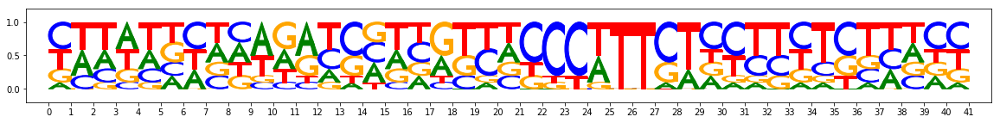

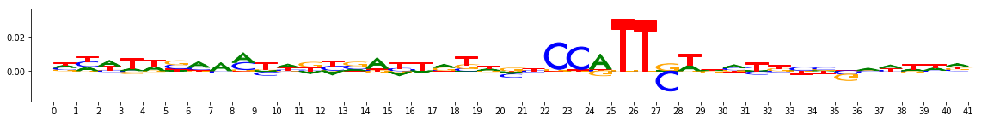

Round correlation -0.056860653195600824
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.018006443977356


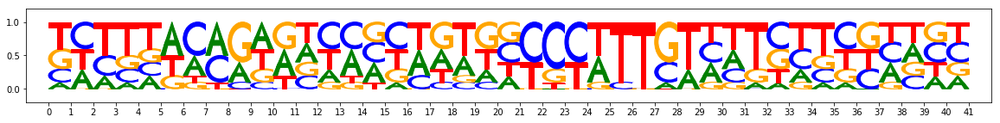

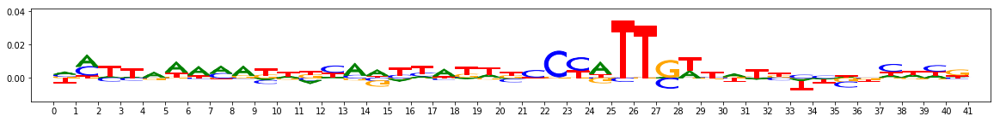

Round correlation -0.08801316888136079
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.512032628059387


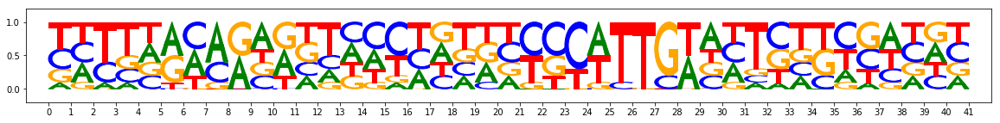

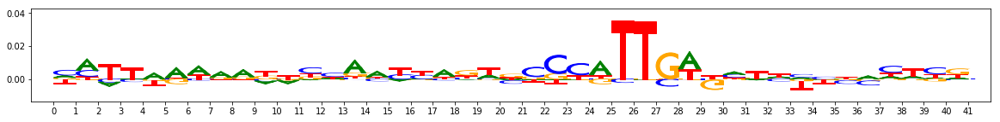

Round correlation -0.07689872843953528
#######################
FILTERING PERCENTILE: 40.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 7.820306301116943)
Coordinate:  example:277,start:537,end:578,rc:False
Contrib scores:


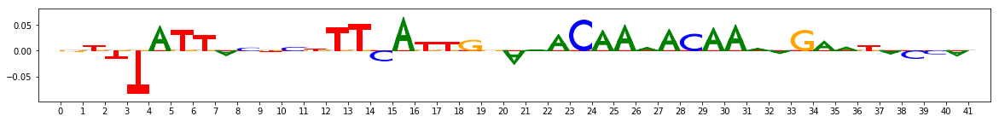

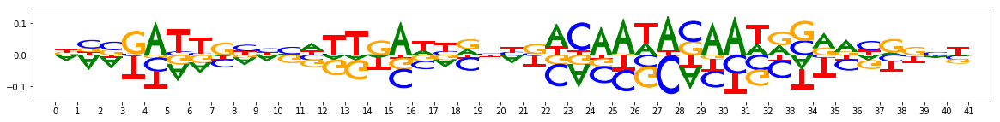

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.693704128265381


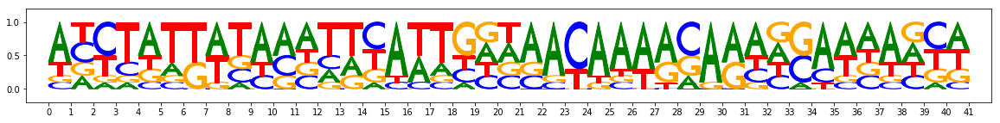

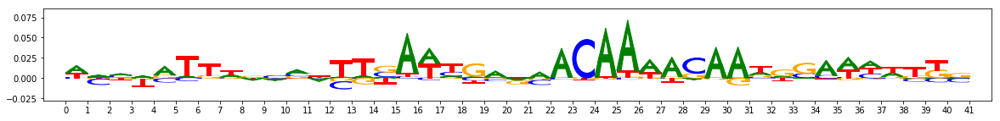

Round correlation 0.036863337454655885
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.64543491601944


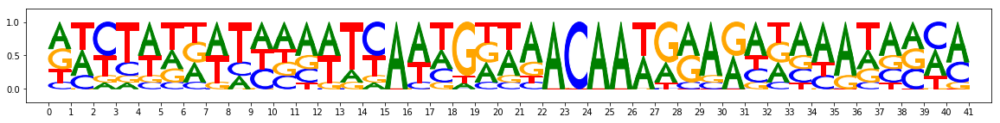

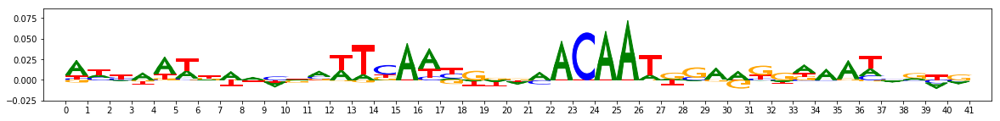

Round correlation 0.1786952558107595
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.60898244380951


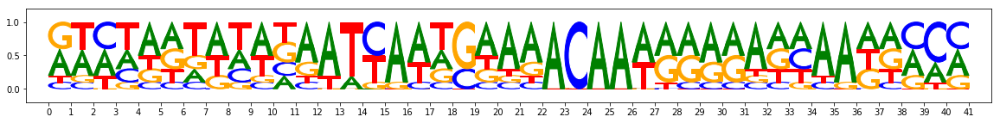

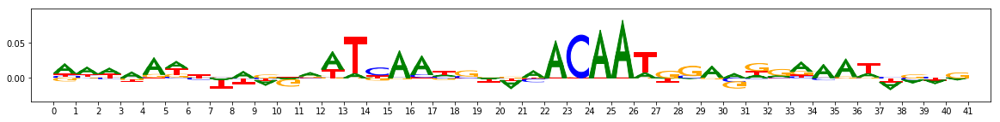

Round correlation 0.19189846672872374
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.820306301116943


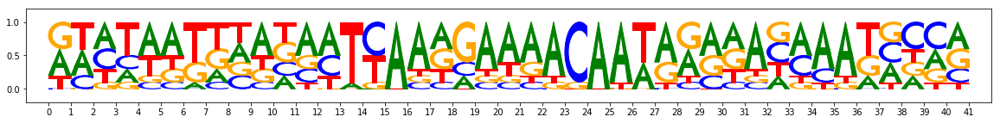

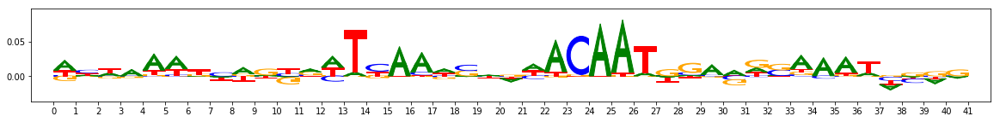

Round correlation 0.17452294268556096
#######################
FILTERING PERCENTILE: 45.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 8.10899293422699)
Coordinate:  example:148,start:528,end:569,rc:False
Contrib scores:


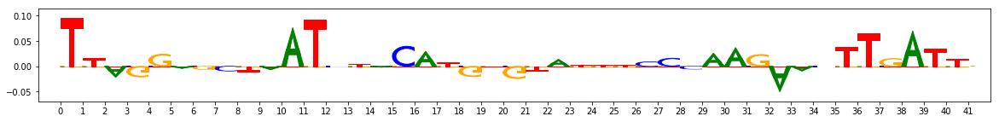

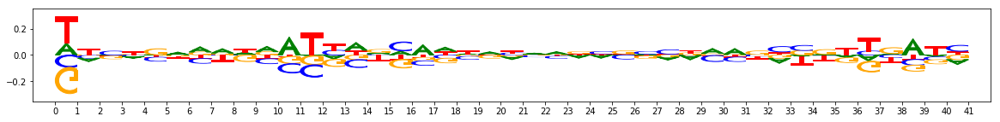

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.8143806755542755


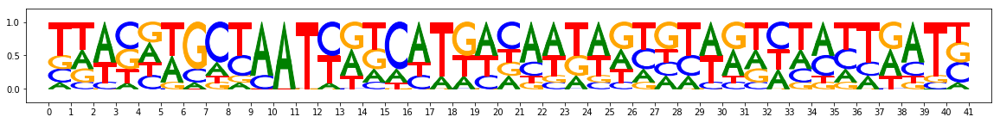

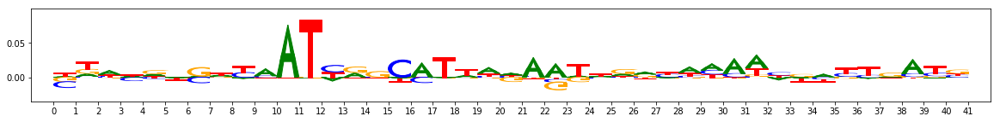

Round correlation 0.06275455220533509
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.979592978954315


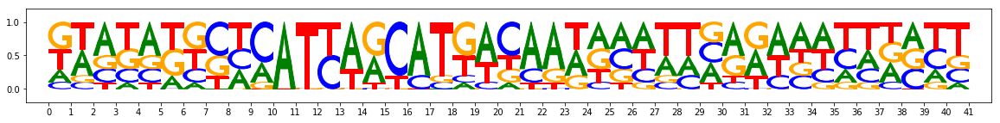

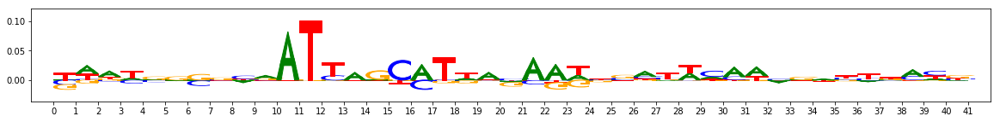

Round correlation 0.0917125989178291
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.621099889278412


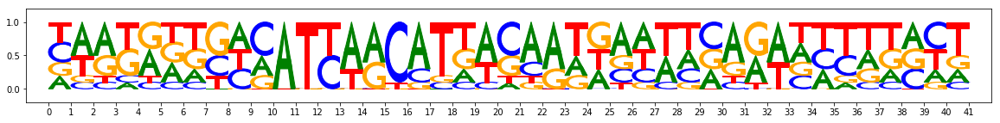

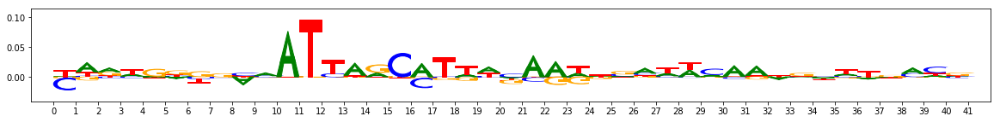

Round correlation 0.07376728601310086
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.10899293422699


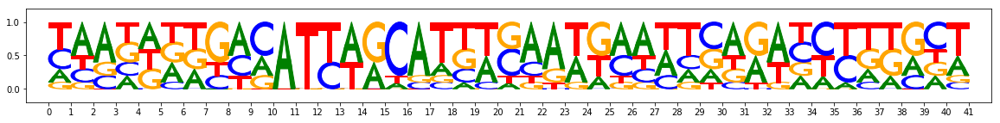

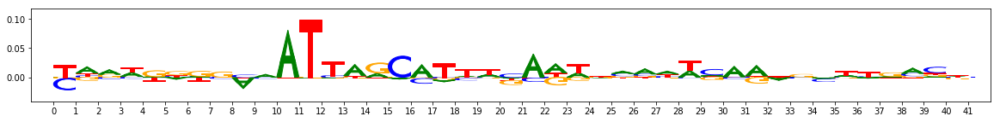

Round correlation 0.06223602580491558
#######################
FILTERING PERCENTILE: 50.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 8.350785434246063)
Coordinate:  example:601,start:474,end:515,rc:False
Contrib scores:


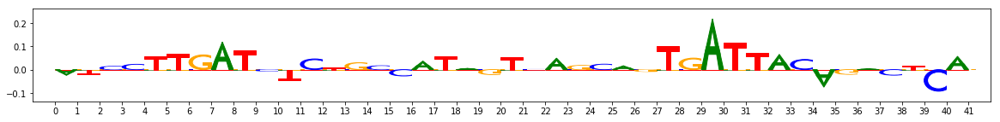

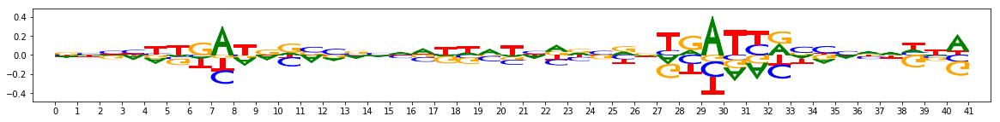

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.922883033752441


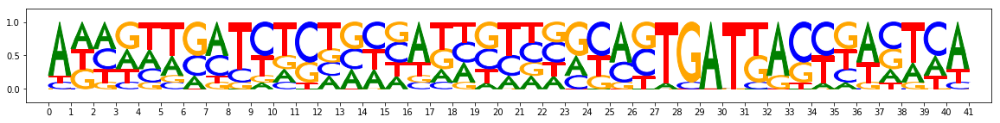

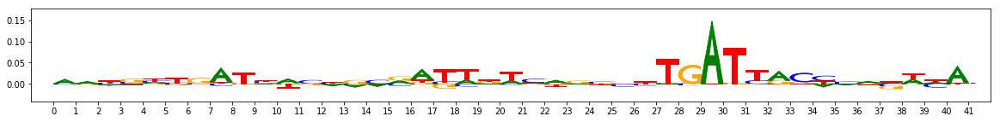

Round correlation 0.13472482296382096
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.818345785140991


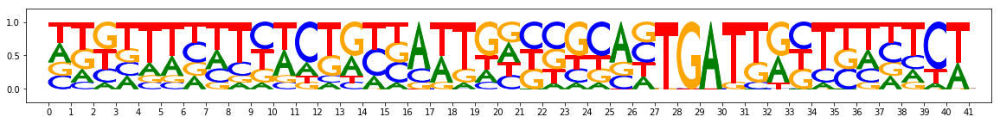

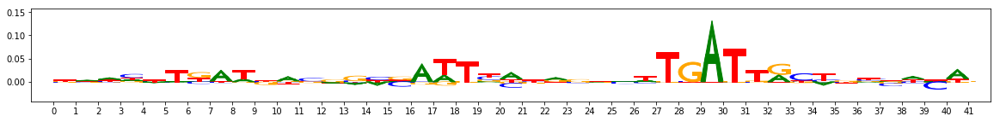

Round correlation 0.029562900929255554
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.350785493850708


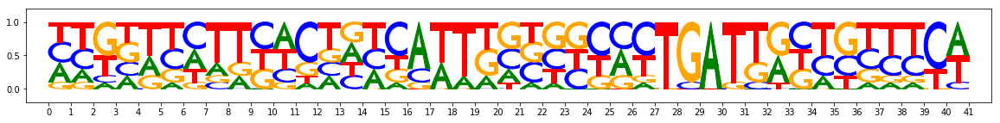

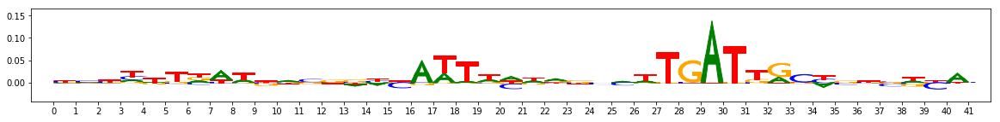

Round correlation 0.006790610663035116
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.350785434246063


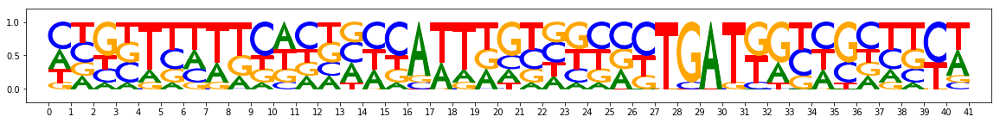

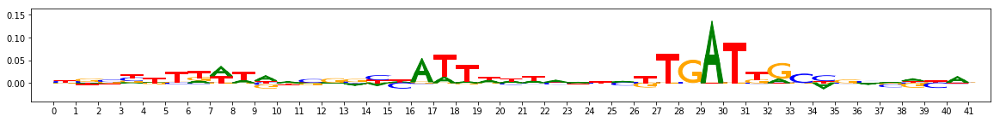

Round correlation 0.0008422359675887063
#######################
FILTERING PERCENTILE: 55.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 8.628335624933243)
Coordinate:  example:274,start:365,end:406,rc:False
Contrib scores:


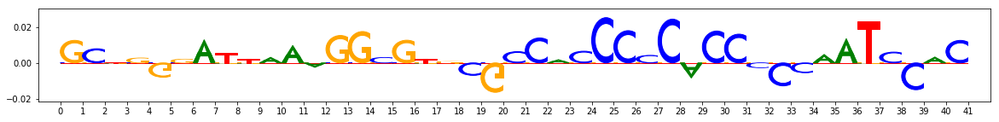

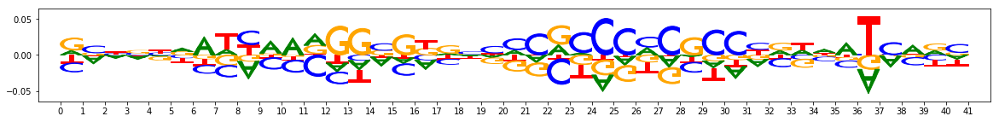

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.489466786384583


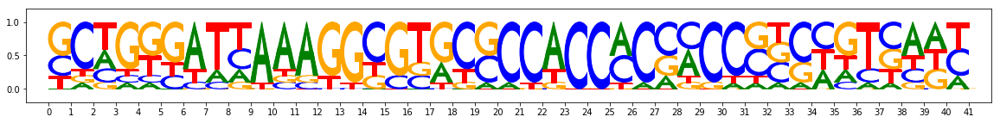

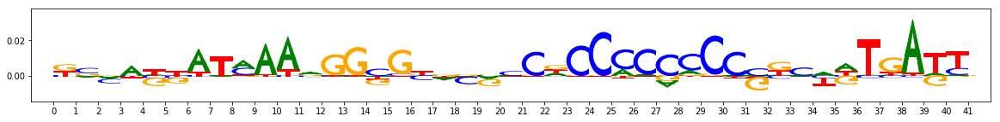

Round correlation 0.2001791301986643
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.848995447158813


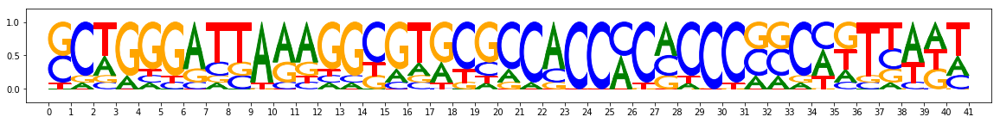

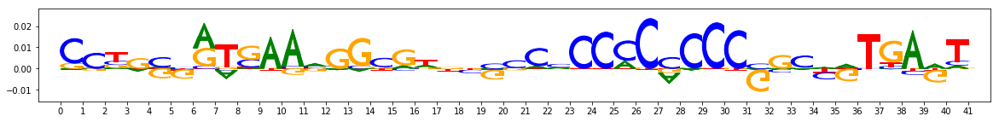

Round correlation 0.26940740404273317
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.903820216655731


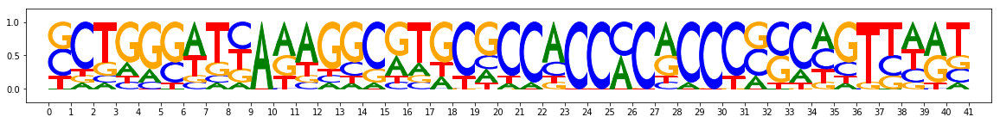

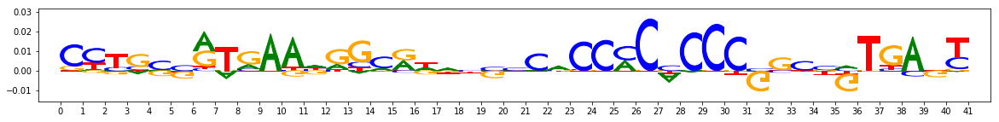

Round correlation 0.2363093372588182
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.628335624933243


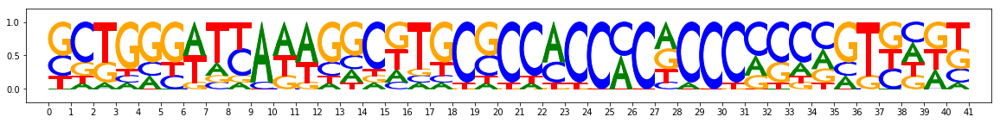

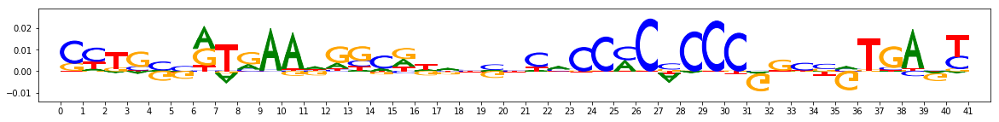

Round correlation 0.19713952184245254
#######################
FILTERING PERCENTILE: 60.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 8.874137043952942)
Coordinate:  example:197,start:500,end:541,rc:False
Contrib scores:


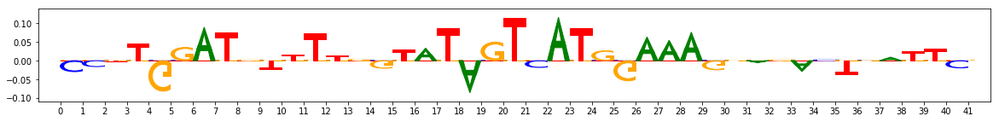

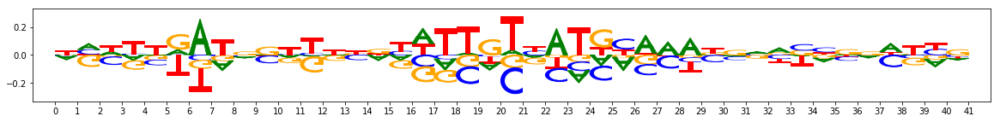

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.245339930057526


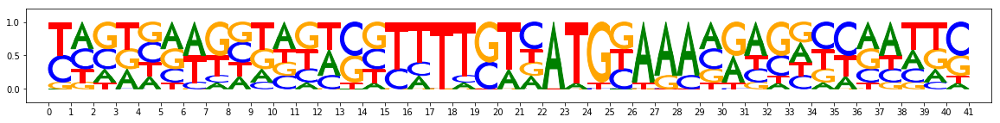

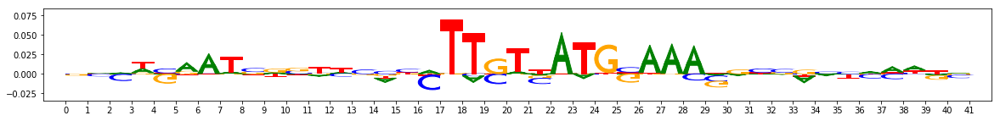

Round correlation 0.20003364744774926
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.021906435489655


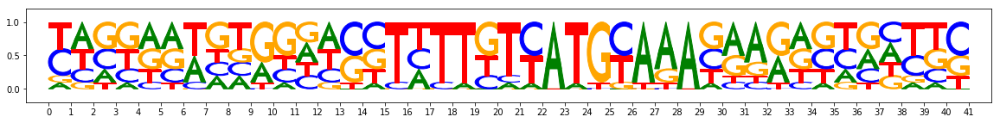

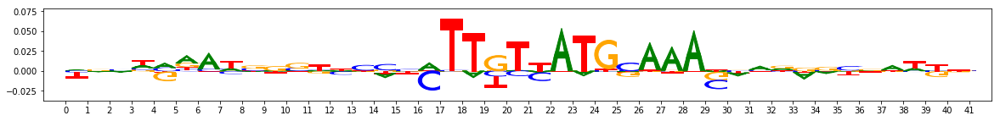

Round correlation 0.20285928402743172
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.71433037519455


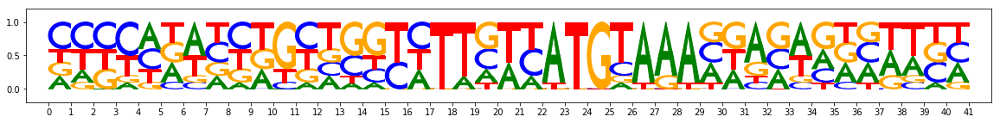

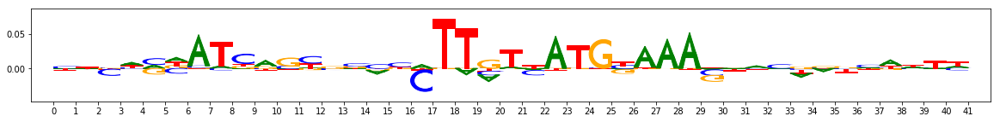

Round correlation 0.1981257340995653
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.874137043952942


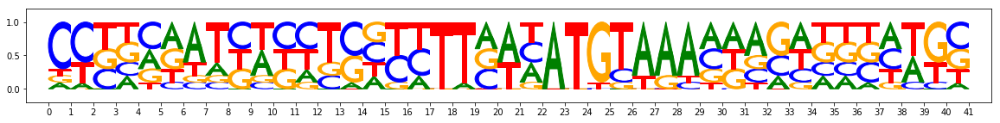

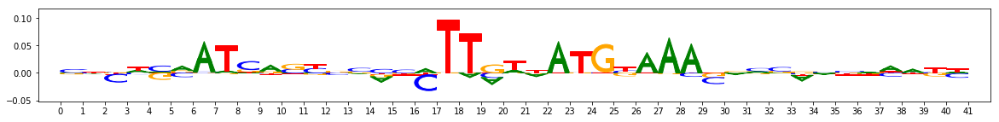

Round correlation 0.18793503236730041
#######################
FILTERING PERCENTILE: 65.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 9.127529859542847)
Coordinate:  example:7,start:621,end:662,rc:False
Contrib scores:


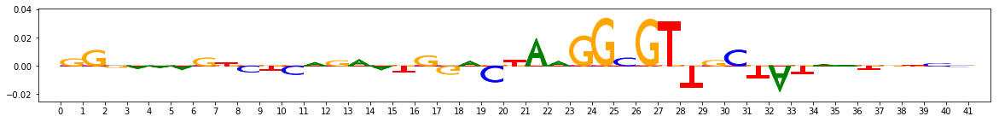

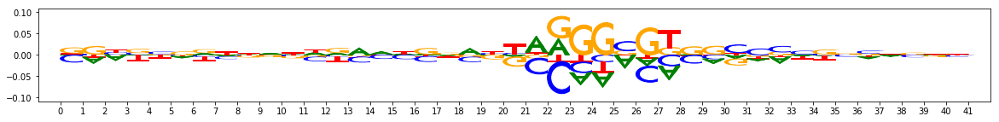

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.29658305644989


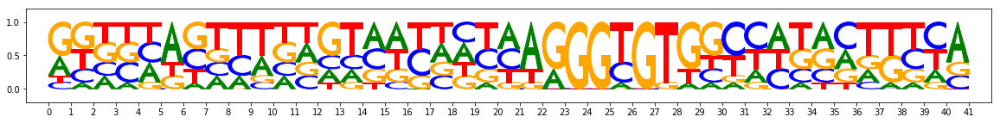

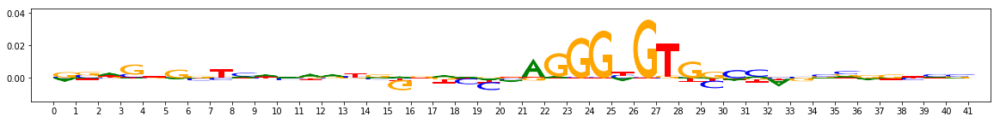

Round correlation 0.0991090058500851
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.127529859542847


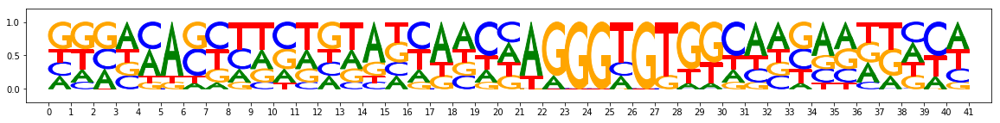

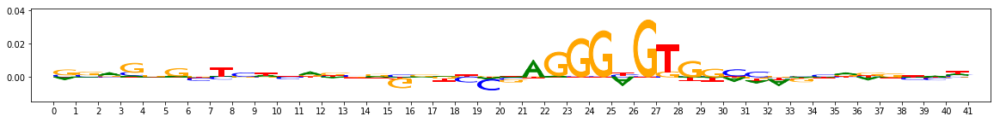

Round correlation 0.10324212626104583
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.127529859542847


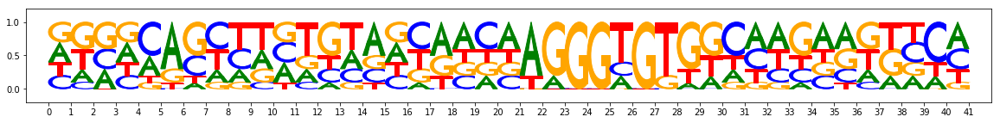

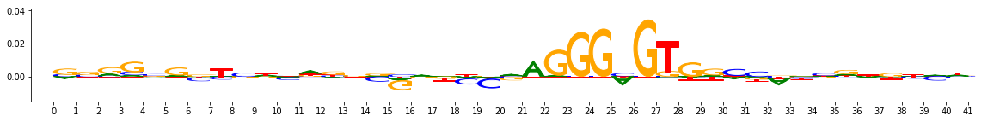

Round correlation 0.12941971655508364
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.127529859542847


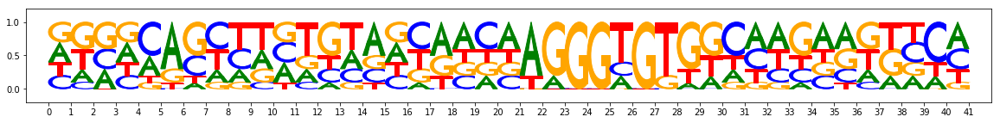

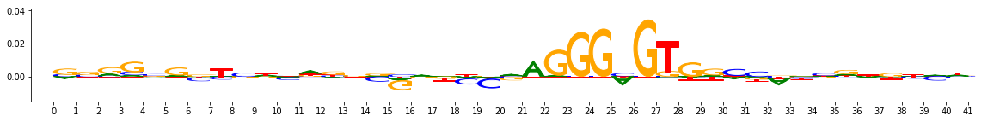

Round correlation 0.11527471504519494
#######################
FILTERING PERCENTILE: 70.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 9.361914157867432)
Coordinate:  example:905,start:563,end:604,rc:False
Contrib scores:


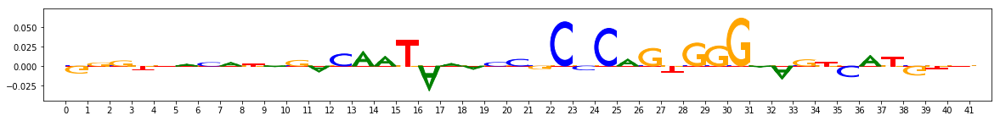

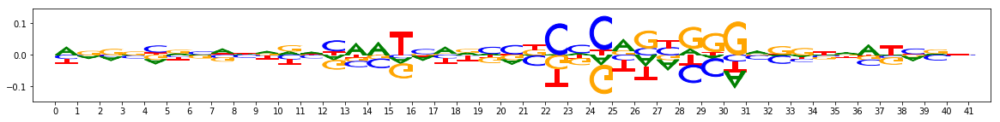

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.533900260925293


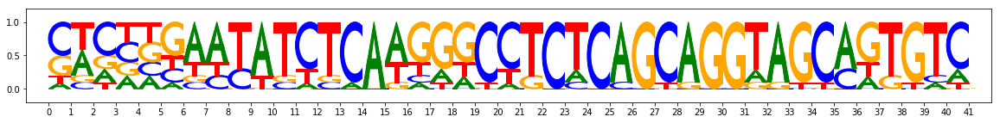

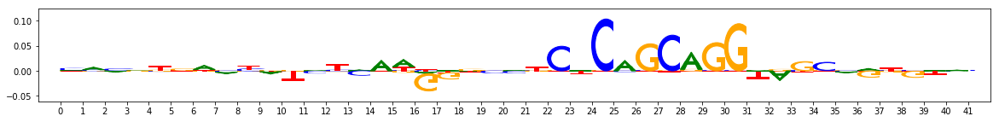

Round correlation 0.13074528546282624
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 11.001460552215576


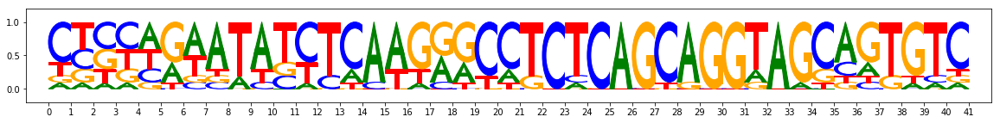

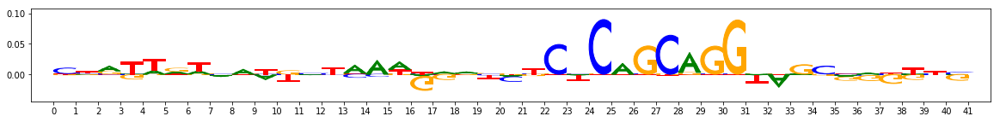

Round correlation 0.09275497921547121
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.127065896987915


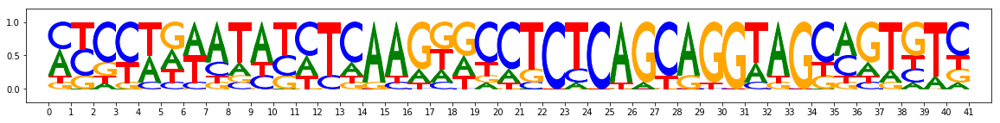

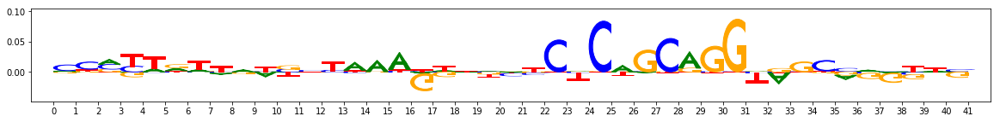

Round correlation 0.06382658028768852
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.361914157867432


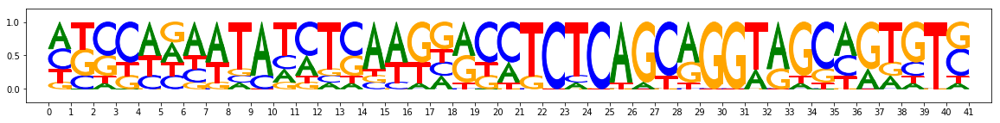

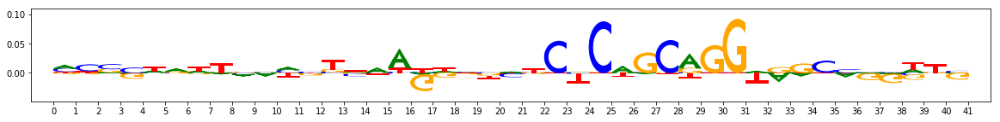

Round correlation 0.09366155286069855
#######################
FILTERING PERCENTILE: 75.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 9.61575174331665)
Coordinate:  example:529,start:420,end:461,rc:False
Contrib scores:


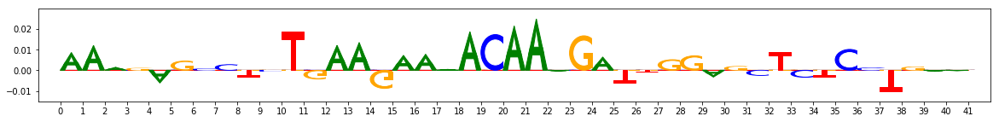

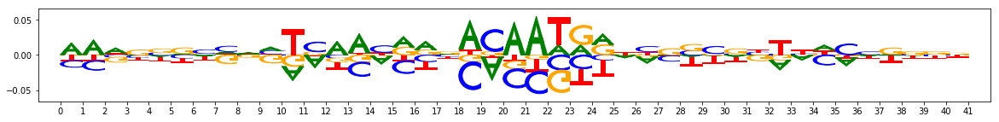

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.53000020980835


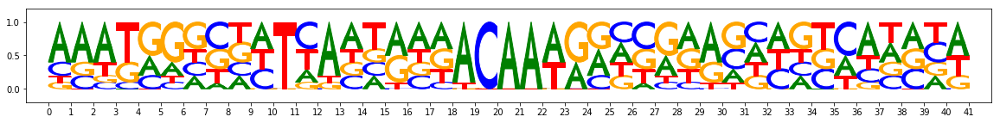

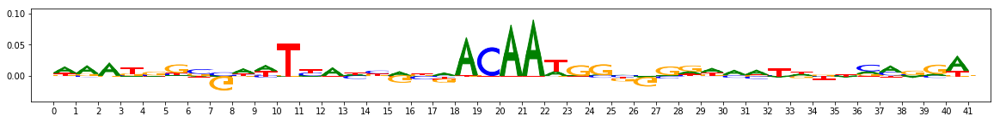

Round correlation 0.11118826093386441
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.152099132537842


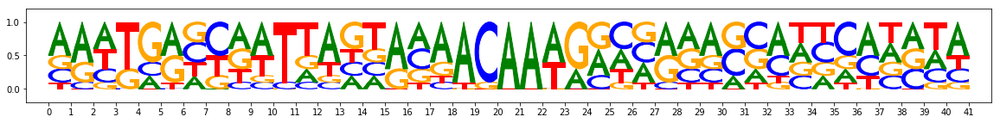

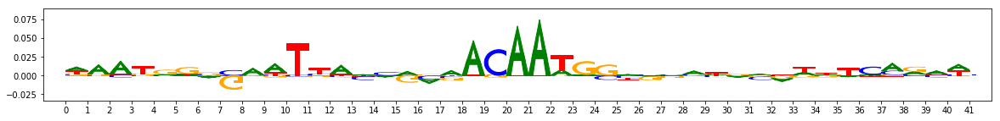

Round correlation 0.08355388626718677
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.856056451797485


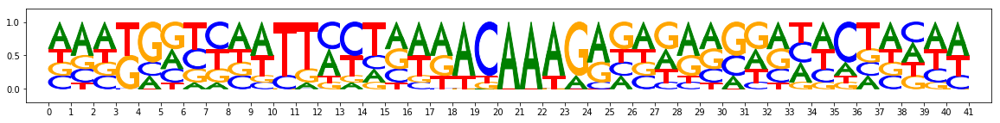

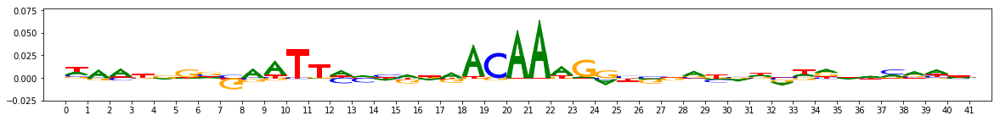

Round correlation 0.10412792691232178
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.61575174331665


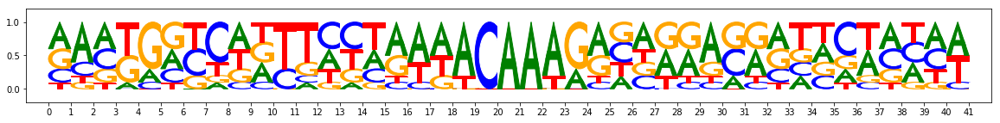

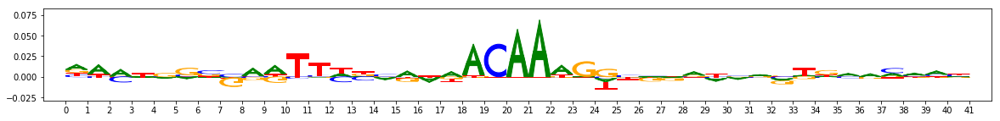

Round correlation 0.09802319569791725
#######################
FILTERING PERCENTILE: 80.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 9.847555041313171)
Coordinate:  example:268,start:600,end:641,rc:False
Contrib scores:


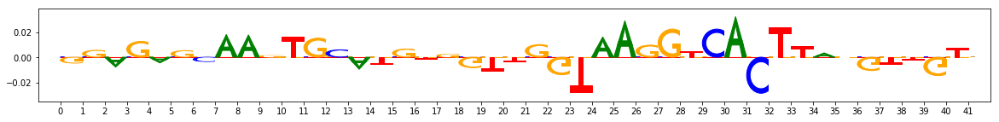

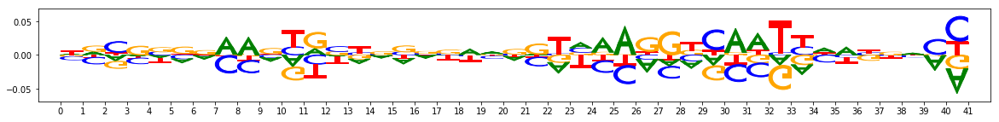

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.098466634750366


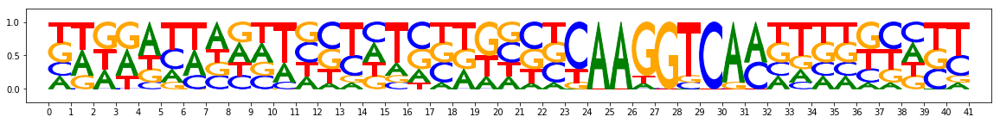

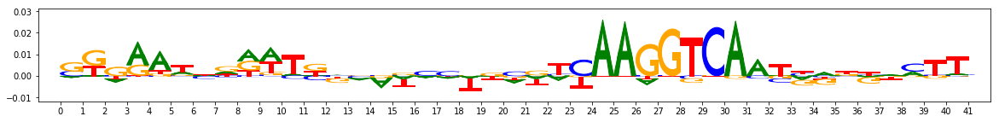

Round correlation 0.01301109428235046
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.614843010902405


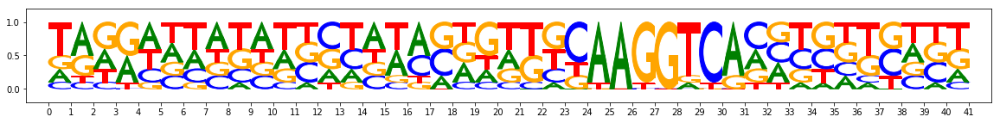

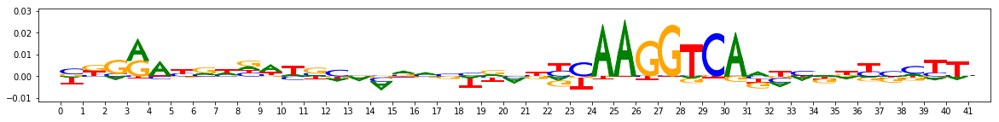

Round correlation 0.02759267320605059
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.028042554855347


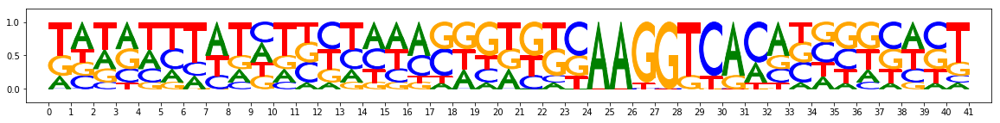

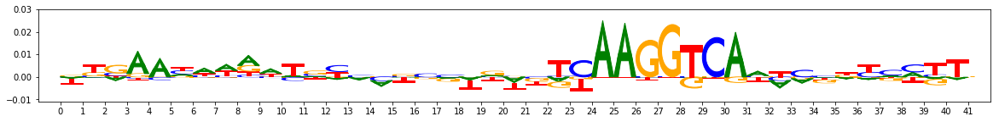

Round correlation 0.014580290663474807
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.847555041313171


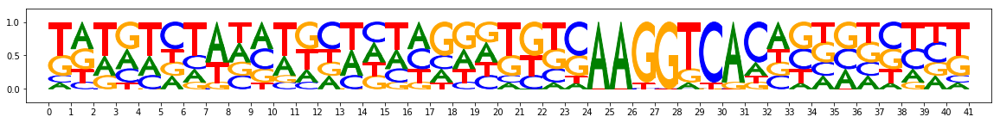

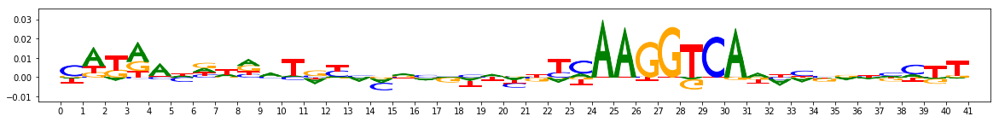

Round correlation 0.05646535222931181
#######################
FILTERING PERCENTILE: 85.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 10.110932469367981)
Coordinate:  example:347,start:485,end:526,rc:False
Contrib scores:


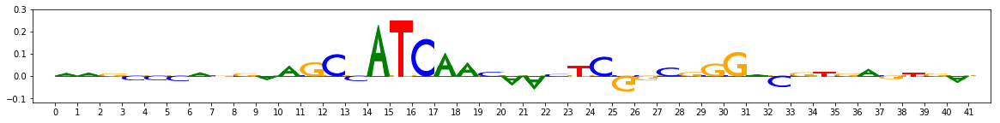

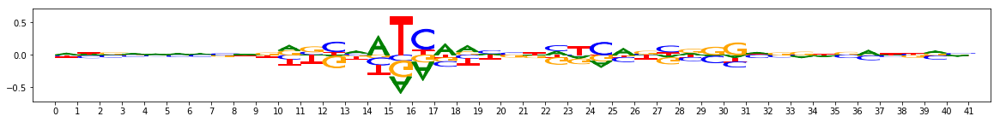

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.315115332603455


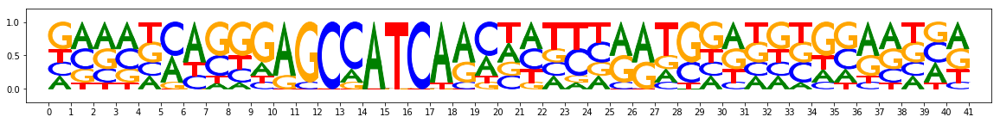

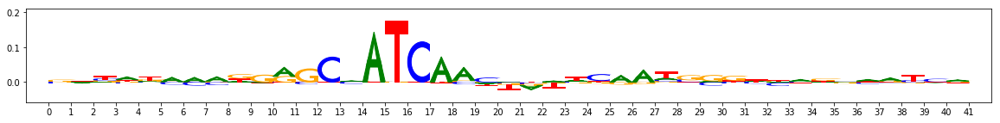

Round correlation 0.2586080172390205
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.17643415927887


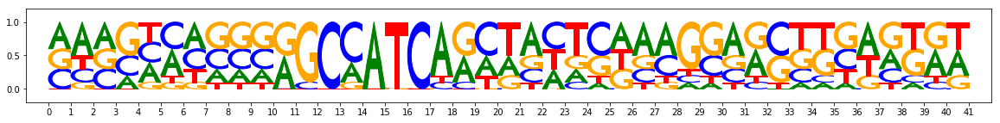

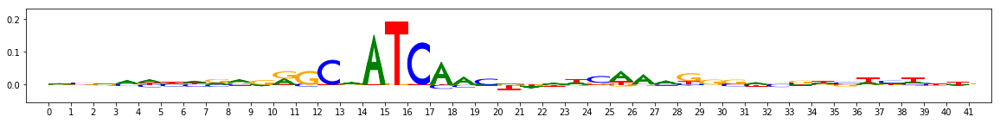

Round correlation 0.16992687572188844
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.643994450569153


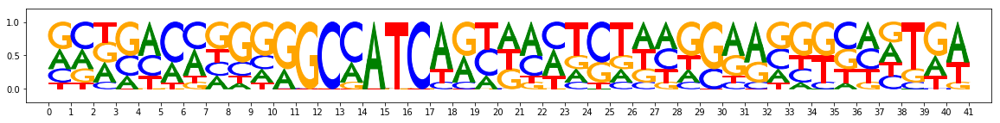

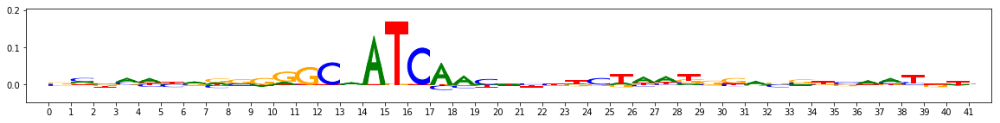

Round correlation 0.15060144818590832
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.110932469367981


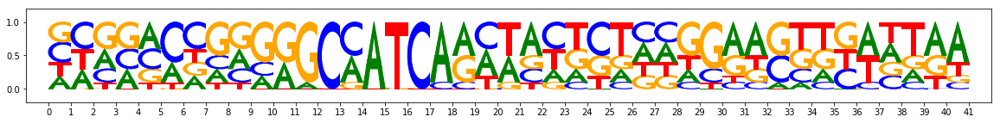

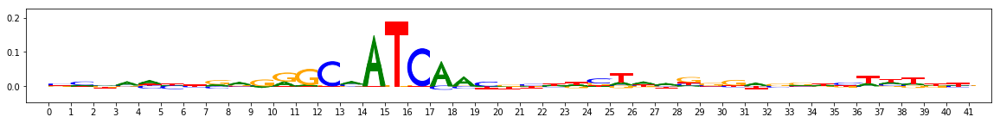

Round correlation 0.15393715788930695
#######################
FILTERING PERCENTILE: 90.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 10.499510526657104)
Coordinate:  example:617,start:549,end:590,rc:False
Contrib scores:


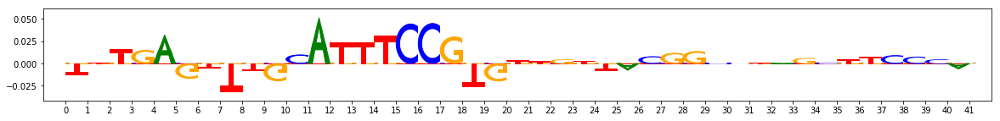

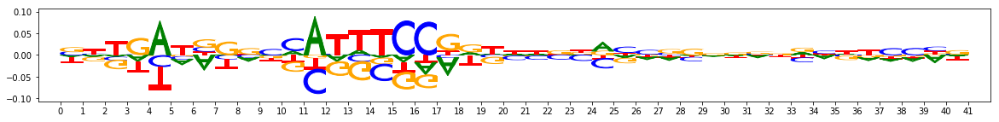

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 11.056730031967163


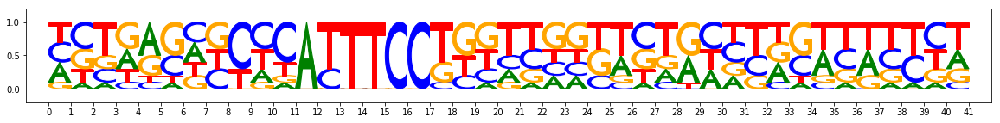

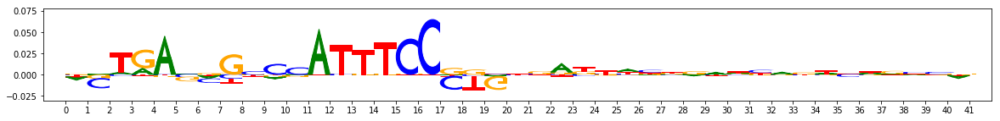

Round correlation 0.09593334675509575
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.58916974067688


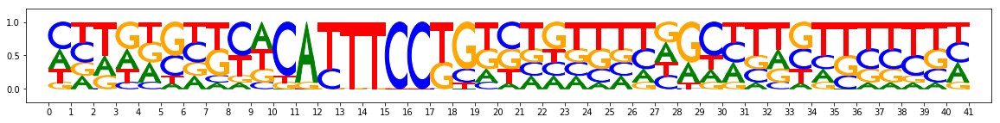

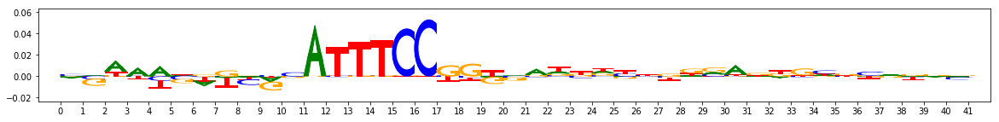

Round correlation 0.06630980428727737
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.967070817947388


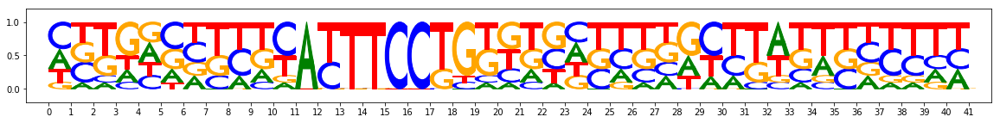

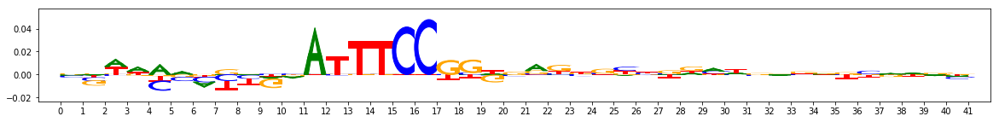

Round correlation 0.09203807743965643
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.499510526657104


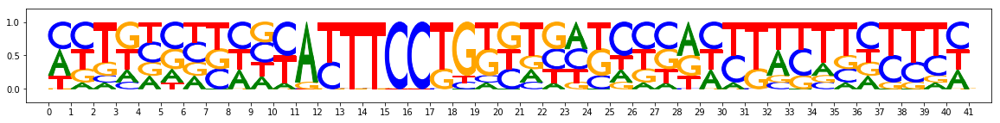

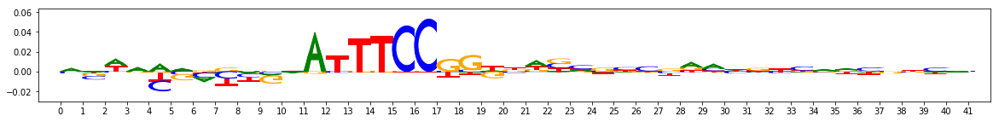

Round correlation 0.060607678522023985
#######################
FILTERING PERCENTILE: 95.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Last round Information Content of 50 NN PFM (value: 11.001460552215576)
Coordinate:  example:1072,start:500,end:541,rc:False
Contrib scores:


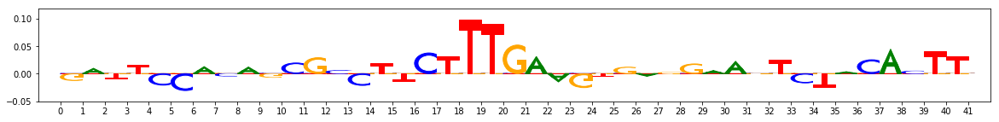

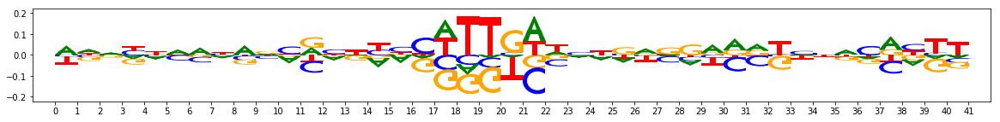

Round 0  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.28097140789032


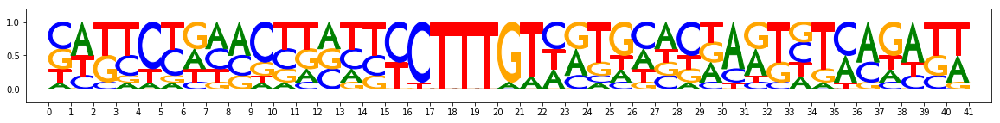

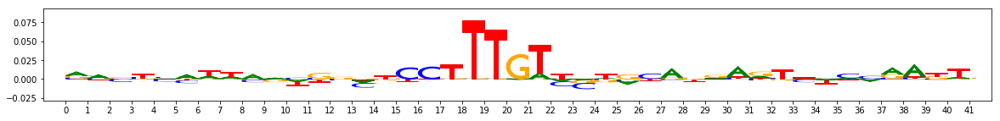

Round correlation 0.01881809424468079
Round 1  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.533900260925293


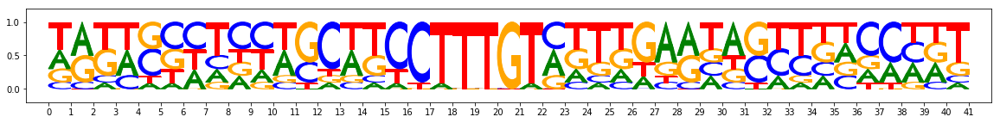

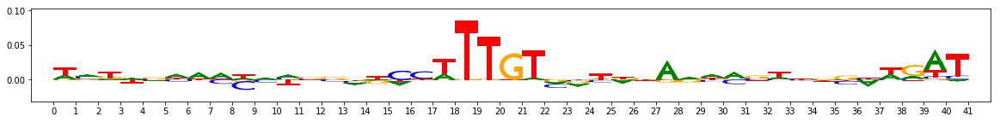

Round correlation 0.0460854101738253
Round 2  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.533900260925293


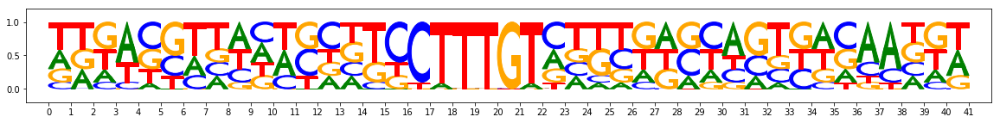

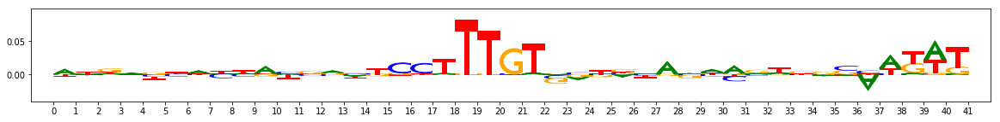

Round correlation 0.05343927794825761
Round 3  PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 11.001460552215576


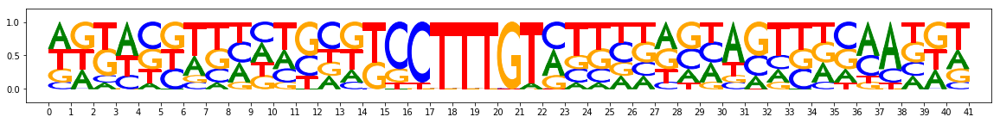

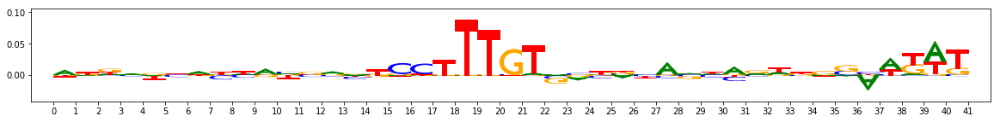

Round correlation 0.05261021215857675


In [21]:
ics_argsort = np.argsort(round_premotif_ics[-1])

def perpos_meannorm(arr):
    return arr - np.mean(arr, axis=-1)[:,None]

from modisco.visualization import viz_sequence
steps=20 #steps to visualize
for i in range(20):
    print("#######################\nFILTERING PERCENTILE:",100*i/steps)
    print("#######################")
    argsort_idx_lookup = i*int(len(seqlets)/steps)
    ics_idx = ics_argsort[argsort_idx_lookup]
    for seqlet_idx, rankingvals, idxtypename in [
        (ics_idx, round_premotif_ics[-1], "Last round Information Content of 50 NN PFM")]:
        print("-----------\nFiltered seqlet @ percentile, sorted via "+idxtypename+" (value: "+str(rankingvals[seqlet_idx])+")")
        print("Coordinate: ",seqlets[seqlet_idx].coor)
        print("Contrib scores:")
        viz_sequence.plot_weights(seqlets[seqlet_idx]["Nanog_profile_wn_contrib_scores"].fwd)
        viz_sequence.plot_weights(perpos_meannorm(seqlets[seqlet_idx]["Nanog_profile_wn_hypothetical_contribs"].fwd))
        for roundidx in range(len(round_premotif_ics)):
            print("Round",roundidx," PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC "
                  +str(round_premotif_ics[roundidx][seqlet_idx]))
            viz_sequence.plot_weights(round_premotif_avgseqlets[roundidx][seqlet_idx]["sequence"].fwd)
            viz_sequence.plot_weights(round_premotif_avgseqlets[roundidx][seqlet_idx]["Nanog_profile_wn_contrib_scores"].fwd)
            #viz_sequence.plot_weights(round_premotif_avgseqlets[roundidx][seqlet_idx]["Nanog_profile_wn_hypothetical_contribs"].fwd)
            print("Round correlation", round_correlations[roundidx][seqlet_idx])
    
#for i in premotif_ics_argsort[::int(len(seqlets)/50)]:
#    print(premotif_ics_argsort[i],
#          premotif_ics[premotif_ics_argsort[i]])
#    viz_sequence.plot_weights(
#        seqlets[premotif_ics_argsort[i]]
#               ["Nanog_profile_wn_contrib_scores"].fwd)

In [ ]:
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt
from collections import Counter

tsne_perplexity = 10
aff_to_dist_mat = modisco.affinitymat.transformers.AffToDistViaInvLogistic()
density_adapted_affmat_transformer =(
            modisco.affinitymat.transformers.TsneConditionalProbs(                      
                    perplexity=tsne_perplexity,                                
                    aff_to_dist_mat=aff_to_dist_mat))
affmat_transformer = modisco.affinitymat.transformers.SymmetrizeByAddition(probability_normalize=True)
clusterer = modisco.cluster.core.LeidenCluster(                         
                affmat_transformer=affmat_transformer,                       
                contin_runs=50,
                n_leiden_iterations=-1,
                verbose=True)

round_embedding = []
subset_slice = slice(None,None,None)
for round_idx in range(len(round_sparse_nn_affmat_withargmax)):
    print("TSNE embedding for round", round_idx)
    dense_nn_affmat = reconstitute_dense_affmat(
                                        sparse_affmat_withargmax=round_sparse_nn_affmat_withargmax[round_idx],
                                        seqlet_neighbors=seqlet_neighbors)[subset_slice,subset_slice]
    dense_nn_distmat = aff_to_dist_mat(dense_nn_affmat)
    embedding = TSNE(verbose=2, perplexity=30, metric="precomputed",
                     random_state=1234).fit_transform(dense_nn_distmat)
    round_embedding.append(embedding)
    plt.gca().scatter(*zip(*embedding), alpha=0.05)
    plt.show()


round_to_cluster_results = {}
#run a tsne viz on the affinities.
for round_idx in [0,1,2,3]:   
    dense_nn_affmat = reconstitute_dense_affmat(
                                        sparse_affmat_withargmax=round_sparse_nn_affmat_withargmax[round_idx],
                                        seqlet_neighbors=seqlet_neighbors)[subset_slice,subset_slice]
    dense_nn_distmat = aff_to_dist_mat(dense_nn_affmat)
    embedding = round_embedding[round_idx]
    
    cluster_results = clusterer(density_adapted_affmat_transformer(dense_nn_affmat),
                                initclusters=None)
    round_to_cluster_results[round_idx] = cluster_results
    plt.gca().scatter(*zip(*embedding), alpha=0.05, c=cluster_results.cluster_indices)
    plt.show()
    print(Counter(cluster_results.cluster_indices))

In [ ]:
from collections import defaultdict

initial_flank_to_add = 10
trim_to_window_size = 30
frac_support_to_trim_to = 0.2
min_num_to_trim_to = 7
expand_trim_expand1 = modisco.aggregator.ExpandSeqletsToFillPattern(                              
                track_set=track_set,                                            
                flank_to_add=initial_flank_to_add).chain(                  
            modisco.aggregator.TrimToBestWindow(                                        
                window_size=trim_to_window_size,                           
                track_names=contrib_scores_track_names)).chain(                 
            modisco.aggregator.ExpandSeqletsToFillPattern(                              
                track_set=track_set,                                            
                flank_to_add=initial_flank_to_add))
postprocessor1 = modisco.aggregator.TrimToFracSupport(                                       
                        min_frac=frac_support_to_trim_to,                  
                        min_num=min_num_to_trim_to,                        
                        verbose=True).chain(expand_trim_expand1)
seqlet_aggregator = modisco.aggregator.GreedySeqletAggregator(                  
            pattern_aligner=modisco.core.CrossContinJaccardPatternAligner(              
                pattern_comparison_settings=pattern_comparison_settings),       
                seqlet_sort_metric=                                             
                    lambda x: -sum([np.sum(np.abs(x[track_name].fwd)) for       
                               track_name in contrib_scores_track_names]),      
            postprocessor=postprocessor1)

def get_cluster_to_aggregate_motif(seqlets, cluster_indices, min_seqlets_in_motif):                   
    num_clusters = max(cluster_indices+1)
    cluster_to_seqlets = defaultdict(list)
    assert len(seqlets)==len(cluster_indices)
    for seqlet,idx in zip(seqlets, cluster_indices):
        cluster_to_seqlets[idx].append(seqlet)
    cluster_to_motif = OrderedDict()
    for i in range(num_clusters):
        if (len(cluster_to_seqlets[i]) >= min_seqlets_in_motif):
            print("Aggregating for cluster "+str(i)+" with "
                  +str(len(cluster_to_seqlets[i]))+" seqlets")
            sys.stdout.flush()
            motifs = seqlet_aggregator(cluster_to_seqlets[i])
            assert len(motifs)<=1
            if (len(motifs) > 0):
                motif = motifs[0]
                cluster_to_motif[i] = motif
    return cluster_to_motif

for round_idx in [0,1,2,3]:
    print("ROUND IDX", round_idx)
    cluster_results = round_to_cluster_results[round_idx]
    embedding = round_embedding[round_idx]
    cluster_to_motif = get_cluster_to_aggregate_motif(
        seqlets=seqlets[subset_slice],
        cluster_indices=cluster_results.cluster_indices,
        min_seqlets_in_motif=min_num_to_trim_to)
    for idx in sorted(cluster_to_motif.keys()):
        print("cluster idx",idx)
        plt.scatter(*zip(*embedding[cluster_results.cluster_indices==idx]),
                    color="red", alpha=0.05)
        plt.scatter(*zip(*embedding[cluster_results.cluster_indices!=idx]),
                    color="blue", alpha=0.05)
        plt.show()
        print("Num seqlets", len(cluster_to_motif[idx].seqlets))
        viz_sequence.plot_weights(cluster_to_motif[idx]["Nanog_profile_wn_contrib_scores"].fwd)
        viz_sequence.plot_weights(cluster_to_motif[idx]["sequence"].fwd)